In [5]:
import geopandas as gpd
import pandas as pd

# kml转换geojson数据
world = gpd.read_file('./kml2geojson/mny.json')
world.head(5)
# files = pd.DataFrame(world)

# files.to_csv('test.csv', encoding='utf-8-sig')
# c1 = world[world['FCNAME'] == '刚果（金）']
# c1

# 对趾点数据
world = gpd.read_file('./worldmap4/world_transformed.json')
world.head(5)
files = pd.DataFrame(world)

files.to_csv('test_world.csv', encoding='utf-8-sig')

# 河流数据
river = gpd.read_file('./river/ne_10m_rivers_lake_centerlines/ne_10m_rivers_lake_centerlines.shp')
files = pd.DataFrame(river)
words = river[river['name_en'] == 'Ligonha']
words['name_zh']

# files.to_csv('test_river_lake.csv', encoding='utf-8-sig')

,id,name,geometry
0,0322F28ACC321A934656,mny1,"POLYGON Z ((117.47137 23.71464 0.00000, 118.06..."
1,0352D59BBB321A957154,mny2,"POLYGON Z ((120.10548 23.70884 0.00000, 120.11..."
2,0184B02E4B321A97E8A8,mny3,"POLYGON Z ((76.41795 9.19940 0.00000, 76.67180..."


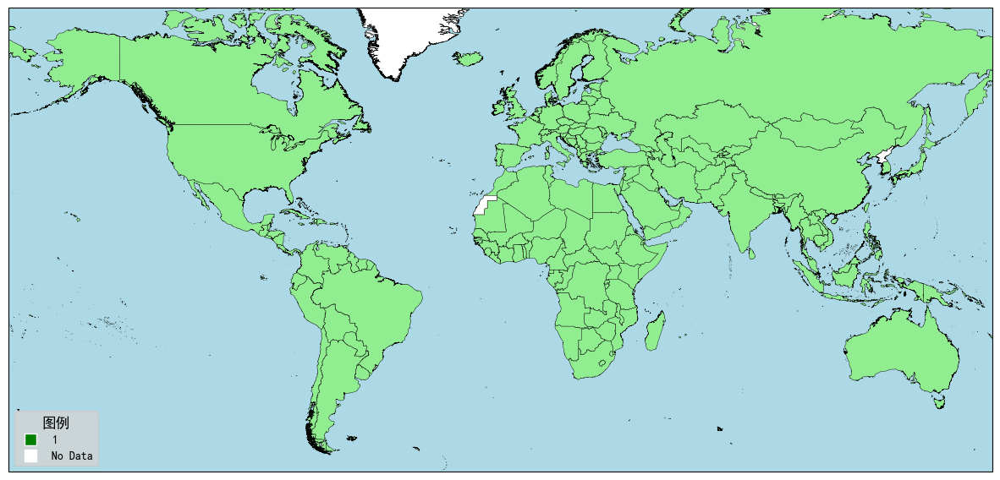

In [147]:
#人均人口
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D

# 读取地图数据
world = gpd.read_file('./worldmap1/World_countries.shp')
# world = gpd.read_file('./worldmap4/world.json')
# 将地图数据转换为 Plate Carrée 投影
world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['格陵兰', '朝鲜', '西撒哈拉']

# 创建绘图对象
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})
ax.add_feature(cfeature.OCEAN, color='lightblue')

# 绘制世界地图
world.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='white', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='1', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='white', markersize=10, label='No Data', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')

# 设置横纵坐标刻度不可见
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 设置地图显示范围
ax.set_extent([-180, 165, -60, 75], crs=ccrs.PlateCarree())

# 保存图像并显示
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


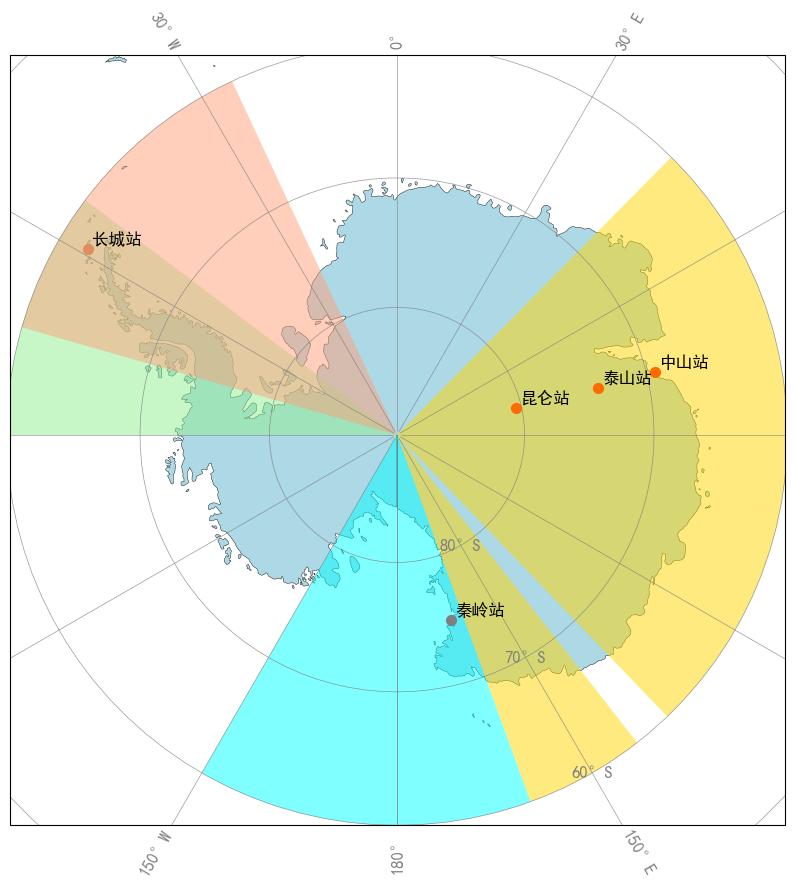

In [110]:
# 极地


import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
from shapely.geometry import Polygon
import numpy as np

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 


def drawPie(lon_start, lon_end, lat_start, lat_end, color):
    lon_start = lon_start
    lon_end = lon_end
    lat_start = lat_start
    lat_end = lat_end

    num_points = 100
    angles = np.linspace(np.radians(lon_start), np.radians(lon_end), num_points)

    lons = []
    lats = []
    for angle in angles:
        lons.append(np.degrees(angle))
        lats.append(lat_start)

    lons = [lon_start] + lons + [lon_end]
    lats = [lat_end] + lats + [lat_end]

    ax.fill(lons, lats, color, alpha=0.5, transform=ccrs.PlateCarree())


# 读取地图数据
world = gpd.read_file('./physical/ne_50m_land.shp')
world = world.to_crs(ccrs.PlateCarree().proj4_init)

coords = [
    (163.7, -74.916667, '秦岭站'), 
    (76.974444, -73.863889, '泰山站'),
    (77.116111, -80.416944, '昆仑站'),
    (76.371652, -69.373587, '中山站'),
    (-58.961855, -62.216838, '长城站')
]
lons, lats, describes = zip(*coords)

# 创建绘图对象
fig, ax = plt.subplots(1, 1, figsize=(20, 10), subplot_kw={'projection': ccrs.SouthPolarStereo()})

# 绘制世界地图
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
ax.scatter(lons, lats, color='red', s=50, transform=ccrs.PlateCarree())
for lon, lat, des in coords:
    ax.annotate(des, (lon, lat), xytext=(3,3), textcoords='offset points', fontsize=12, color='black', transform=ccrs.PlateCarree())

#智利
drawPie(-90, -53, -60, -90, 'lightgreen')
#阿根廷
drawPie(-74, -25, -60, -90, 'lightsalmon')
#澳大利亚
drawPie(160, 142.033333, -60, -90, 'gold')
drawPie(136.183333, 44.633333, -60, -90, 'gold')
#新西兰
#澳大利亚
drawPie(160, 180, -60, -90, 'cyan')
drawPie(-150, -180, -60, -90, 'cyan')


gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.8, linestyle='-')
gl.xlocator = plt.MultipleLocator(30)
gl.ylocator = plt.MultipleLocator(10)
gl.xformatter = cticker.LongitudeFormatter()
gl.yformatter = cticker.LatitudeFormatter()


# 设置标签样式
gl.xlabel_style = {'size': 12, 'color': 'gray'}
gl.ylabel_style = {'size': 12, 'color': 'gray'}


# 设置横纵坐标刻度不可见
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 设置地图显示范围
ax.set_extent([-180, 180, -90, -60], crs=ccrs.PlateCarree())
# ax.gridlines()

# 保存图像并显示
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


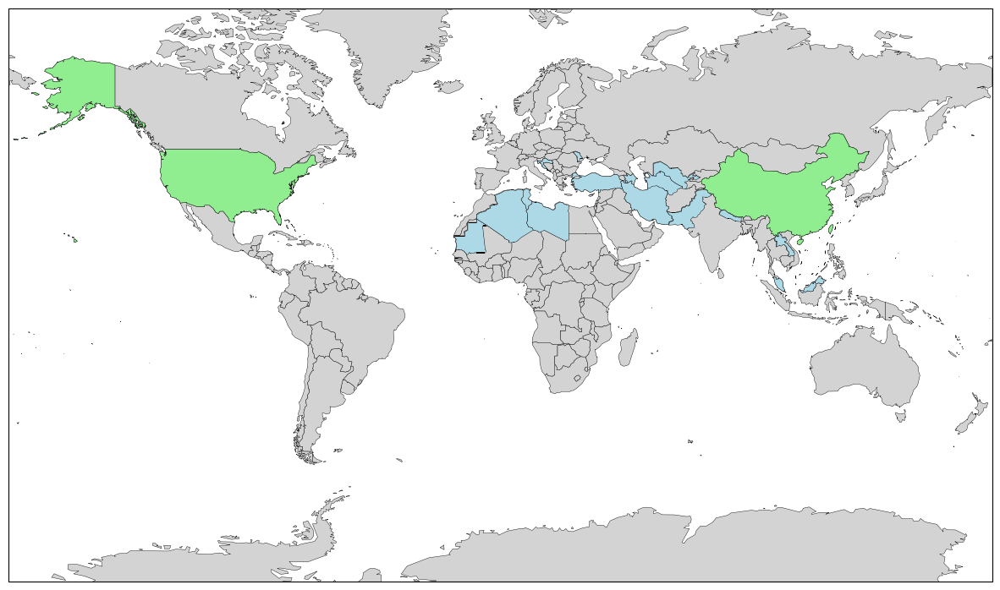

In [59]:
#月亮上有国旗
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# 读取地图数据
world = gpd.read_file('./worldmap4/world.json')

# 将地图数据转换为 Plate Carrée 投影
world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['美国', '中国']
countries_to_fill2 = ['马来西亚', '新加坡', '文莱', '巴基斯坦', '尼泊尔', '伊朗', '土库曼斯坦', '乌兹别克斯坦', '阿塞拜疆', '土耳其', '克罗地亚', '摩尔多瓦',
                      '毛里塔尼亚', '阿尔及利亚', '突尼斯', '利比亚', '老挝']

# 创建绘图对象
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})

# 绘制世界地图
world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 绘制中国和澳大利亚的地理数据
# china.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
# australia.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill2:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 设置横纵坐标刻度不可见
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 设置地图显示范围
ax.set_extent([180, -180, -80, 80], crs=ccrs.PlateCarree())

# 保存图像并显示
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


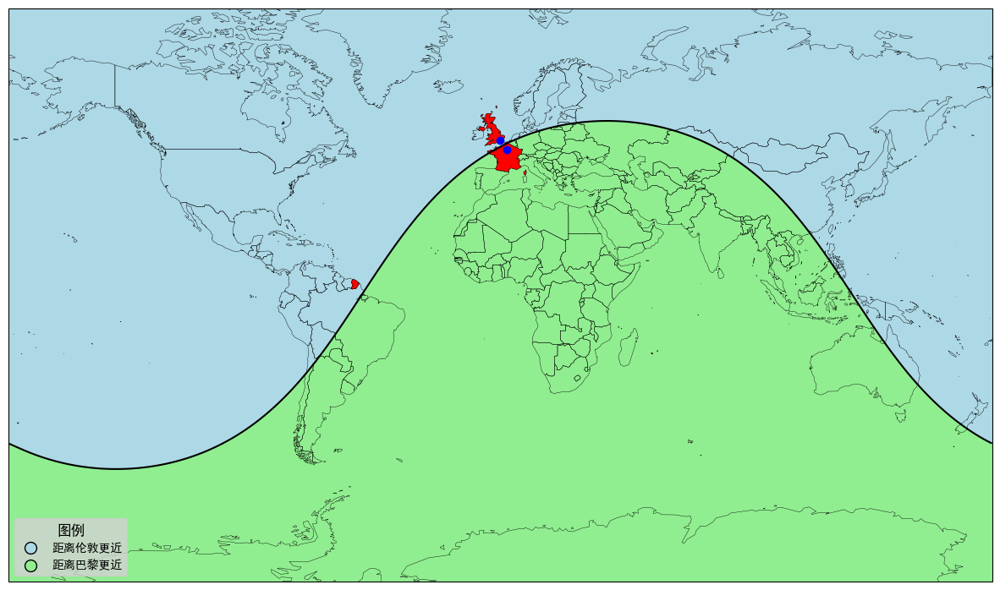

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from geopy.distance import geodesic
from matplotlib.lines import Line2D

# 读取地图数据
world = gpd.read_file('./worldmap4/world.json')

# 将地图数据转换为 Plate Carrée 投影
world = world.to_crs(ccrs.PlateCarree())

# 选取中国和澳大利亚的地理数据
c1 = world[world['name'] == '英国']
c2 = world[world['name'] == '法国']

# 创建绘图对象
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})

# 绘制世界地图
world.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


c1.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
c2.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 生成经纬度网格
lat1, lon1 = 51.50777890052945, -0.12601613293049535
lat2, lon2 = 48.857870088293815, 2.3510885557827286
lats = np.linspace(-90, 90, 300)
lons = np.linspace(-180, 180, 600)
lon_grid, lat_grid = np.meshgrid(lons, lats)
distance_diff = np.zeros(lon_grid.shape)

# 计算每个网格点到目标点的距离差
for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        d1 = geodesic(point, (lat1, lon1)).kilometers
        d2 = geodesic(point, (lat2, lon2)).kilometers
        distance_diff[i, j] = d1 - d2

# 绘制轮廓线
contourf = ax.contourf(lon_grid, lat_grid, distance_diff, levels=[-1e10, 0, 1e10], colors=['lightblue', 'lightgreen'], transform=ccrs.PlateCarree(), zorder=0)
contour = ax.contour(lon_grid, lat_grid, distance_diff, levels=[0], colors='k', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2], [lat1, lat2], color='b', marker='o', zorder=5, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightblue', markersize=10, label='距离伦敦更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightgreen', markersize=10, label='距离巴黎更近', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')
# 设置横纵坐标刻度不可见
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 设置地图显示范围
ax.set_extent([180, -180, -80, 80], crs=ccrs.PlateCarree())

# 保存图像并显示
plt.savefig('output3.png', dpi=300, bbox_inches='tight')
plt.show()


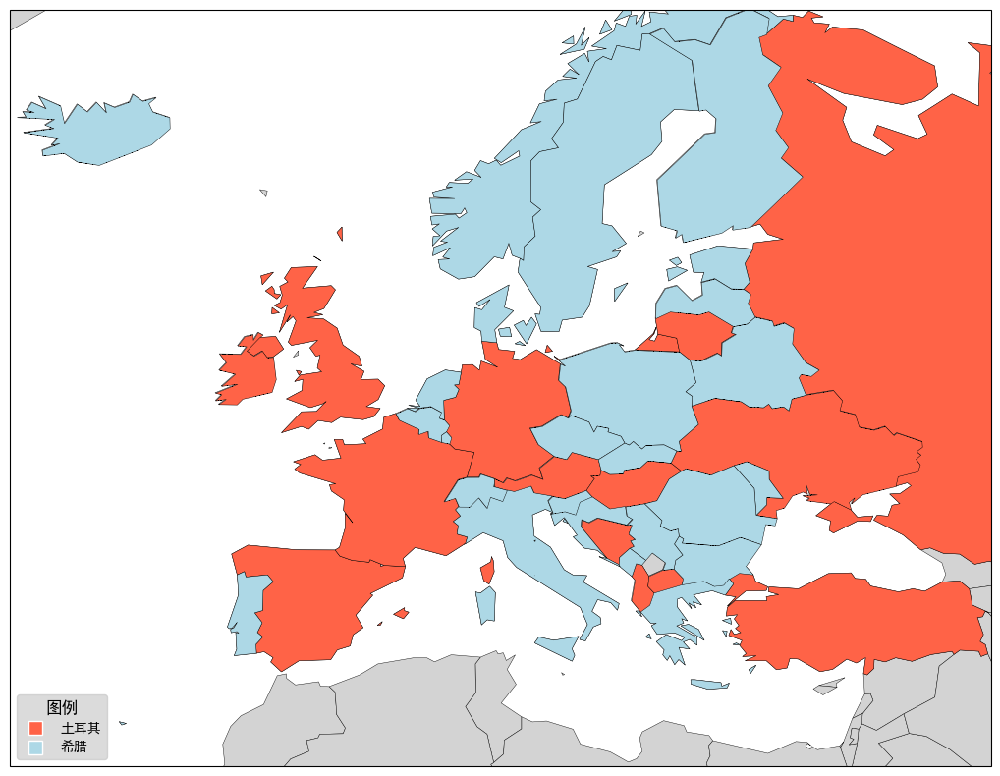

In [7]:
#土耳其or希腊酸奶
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['英国', '爱尔兰', '西班牙', '法国', '德国', '奥地利', '匈牙利', '波黑', '阿尔巴尼亚', '北马其顿', '乌克兰', '俄罗斯',
                      '立陶宛', '土耳其']
countries_to_fill2 = ['冰岛', '挪威', '瑞典', '芬兰', '丹麦', '比利时', '荷兰', '卢森堡', '爱沙尼亚', '拉脱维亚', '白俄罗斯', '波兰', '捷克', '斯洛伐克', '摩尔多瓦',
                      '罗马尼亚', '保加利亚', '葡萄牙', '意大利', '瑞士', '克罗地亚', '斯洛文尼亚', '塞尔维亚', '黑山', '希腊']

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})


world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='tomato', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill2:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='tomato', markersize=10, label='土耳其', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='希腊', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([45, -25, 30, 70], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


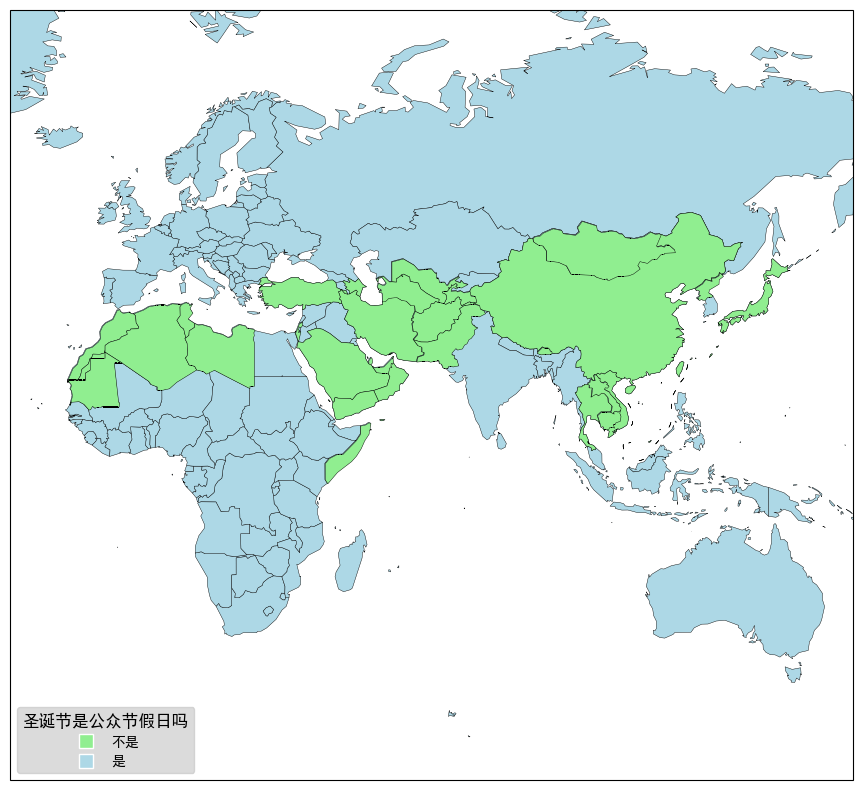

In [5]:
#过不过圣诞节
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['日本', '中国', '朝鲜', '蒙古', '越南', '老挝', '柬埔寨', '泰国', '不丹', '塔吉克斯坦', '阿富汗', '乌兹别克斯坦',
                      '土库曼斯坦', '巴基斯坦', '伊朗', '阿塞拜疆', '土耳其', '沙特阿拉伯', '阿曼', '也门', '阿联酋', '巴林', '索马里', '以色列', '摩洛哥',
                      '西撒哈拉', '阿尔及利亚', '突尼斯', '利比亚', '毛里塔尼亚', '卡塔尔']

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})


world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='不是', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='是', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='圣诞节是公众节假日吗', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([160, -30, 80, -60], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()

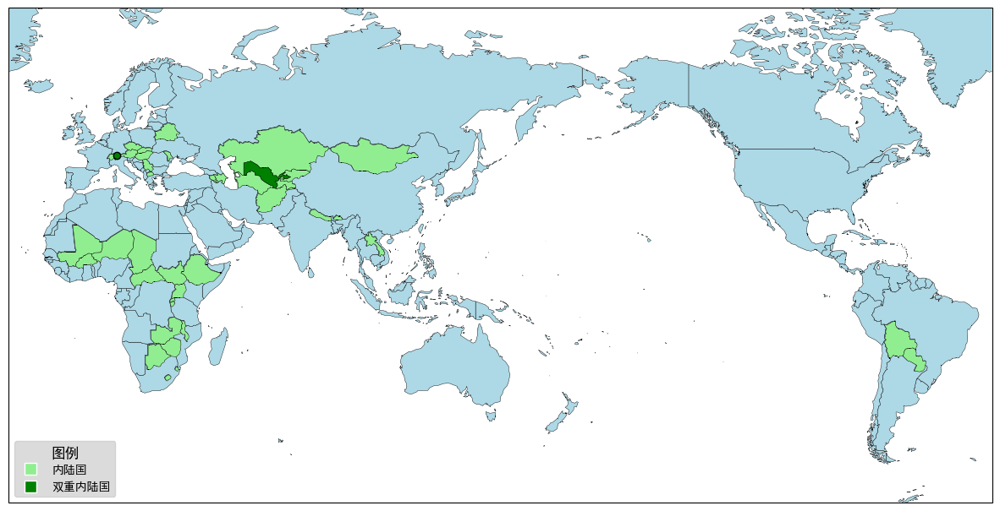

In [16]:
#双重内陆国
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['蒙古', '老挝', '尼泊尔', '不丹', '哈萨克斯坦', '吉尔吉斯斯坦', '土库曼斯坦', '塔吉克斯坦', '阿富汗', '阿塞拜疆', '亚美尼亚', '白俄罗斯',
                      '瑞士', '捷克', '斯洛伐克', '匈牙利', '塞尔维亚', '北马其顿', '摩尔多瓦', '马里', '尼日尔', '乍得', '中非', '南苏丹', '乌干达',
                      '卢旺达', '布隆迪', '布基纳法索', '博茨瓦纳', '津巴布韦', '赞比亚', '马拉维', '斯威士兰', '莱索托', '玻利维亚', '巴拉圭', '埃塞俄比亚', '奥地利']

countries_to_fill2 = ['乌兹别克斯坦', '列支敦士登']
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=150)})

world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill2:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='green', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

lat1, lon1 = 47.141248561599134, 9.519914522775755
ax.scatter(lon1, lat1, edgecolor='black', facecolor='green', marker='o', zorder=5, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='内陆国', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='双重内陆国', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([180, -180, 80, -65], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()

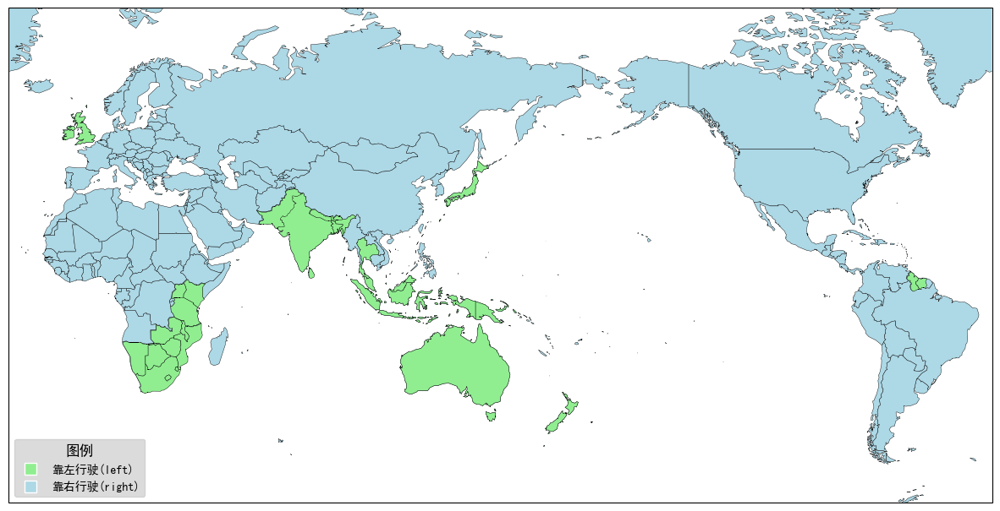

In [69]:
#靠左行驶的国家
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['英国', '爱尔兰', '南非', '斯威士兰', '莱索托', '纳米比亚', '博茨瓦纳', '津巴布韦', '莫桑比克', '赞比亚', '马拉维',
                      '坦桑尼亚', '肯尼亚', '乌干达', '巴基斯坦', '印度', '尼泊尔', '不丹', '孟加拉国', '泰国', '马来西亚', '印度尼西亚', '东帝汶', '巴布亚新几内亚',
                      '澳大利亚', '新西兰', '日本', '圭亚那', '苏里南', '斯里兰卡']

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=150)})

world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='靠左行驶(left)', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='靠右行驶(right)', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([180, -180, 80, -65], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()

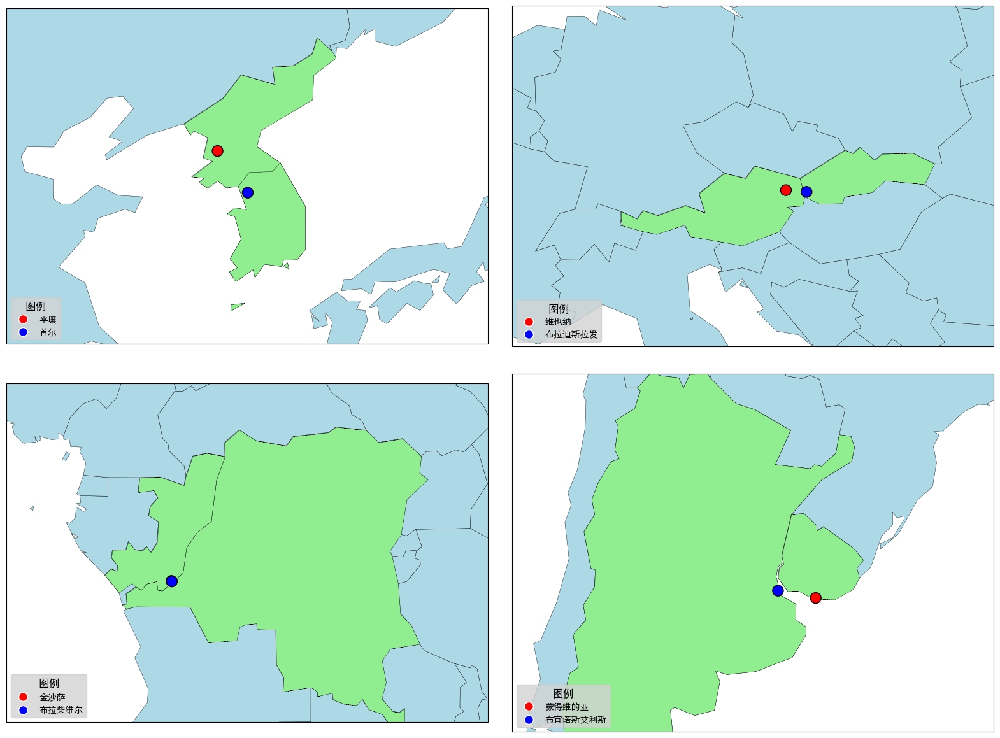

In [25]:
# 最近的首都
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
import numpy as np

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())

def plot_map(ax, countryList, scopeList, capitalList, capitalNameList):

    
    world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

    ax.scatter([capitalList[0]], [capitalList[1]], edgecolor='black', facecolor=['red', 'blue'], marker='o', s=150, zorder=5, transform=ccrs.PlateCarree())

    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label=capitalNameList[0], linestyle='None'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label=capitalNameList[1], linestyle='None')
    ]
    legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
    legend.get_frame().set_facecolor('lightgray')


    ax.tick_params(axis='both', which='both', length=0, labelsize=0)
    ax.set_extent(scopeList, crs=ccrs.PlateCarree())

# 创建四个小图
fig, axs = plt.subplots(2, 2, figsize=(20, 15), subplot_kw={'projection': ccrs.Miller(central_longitude=150)})
axs = axs.flatten()

# 绘制每个小图
lat1, lon1 = 39.04447665059203, 125.7702658972485
lat2, lon2 = 37.553537721137054, 127.02504620498168
lat3, lon3 = 48.216791603518, 16.374932511063978
lat4, lon4 = 48.15971371754906, 17.230309418705197
lat5, lon5 = -4.276527620661273, 15.28382252620716
lat6, lon6 = -4.306678263132358, 15.308560596963552
lat7, lon7 = -34.84616790420912, -56.0826684655311
lat8, lon8 = -34.443963416219184, -58.433743434535685
country = [['朝鲜', '韩国'], ['奥地利', '斯洛伐克'], ['刚果（金）', '刚果（布）'],['阿根廷', '乌拉圭']]
scope = [[117, 137, 32, 44], [5, 25, 43, 54], [5, 35, -13, 8], [-75, -45, -42, -22]]
capital = [[[lon1, lon2], [lat1, lat2]], [[lon3, lon4], [lat3, lat4]], [[lon5, lon6], [lat5, lat6]], [[lon7, lon8], [lat7, lat8]]]
capitalName = [['平壤', '首尔'], ['维也纳', '布拉迪斯拉发'], ['金沙萨', '布拉柴维尔'], ['蒙得维的亚', '布宜诺斯艾利斯']]
count = 0
for ax in axs:
    plot_map(ax, country[count], scope[count], capital[count], capitalName[count])
    count += 1

# 调整布局
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# 保存并显示图片
# plt.savefig('output_combined.png', dpi=300, bbox_inches='tight')
plt.show()


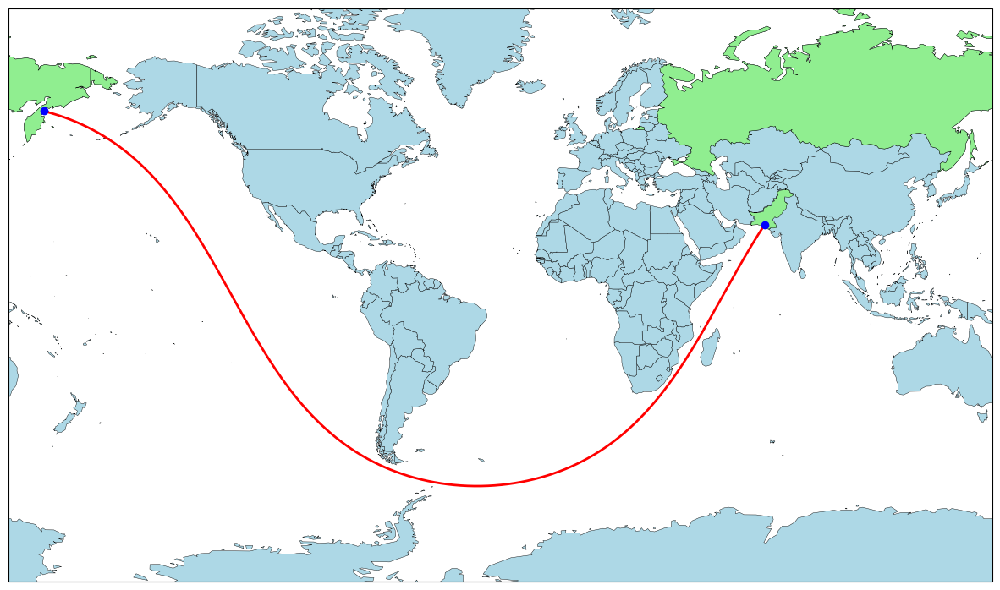

In [129]:
#最长海上直线
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from pyproj import Geod

# 读取世界地图数据
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())

# 提取俄罗斯和巴基斯坦的数据
c1 = world[world['name'] == '俄罗斯']
c2 = world[world['name'] == '巴基斯坦']

# prepare points
# P1
lat1, lon1 = 59.18232447782983, 162.90673502275226
# P1's antipode
lat1a = -lat1
lon1a = lon1 - 180
# p2
lat2, lon2 = 25.174689841781433, 66.75388912356865
# P2's antipode
lat2a = -lat2
lon2a = lon2 - 180


# 创建图形和投影
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=-30)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
c1.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
c2.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 使用 pyproj 的 Geod 计算大圆弧线
geod = Geod(ellps="WGS84")

# Geodetic lines: P2-P1_antipode
num_points = 200
point1 = geod.npts(lon2, lat2, lon1a, lat1a, num_points)
# Geodetic lines: P1_antipode-P2_antipode
point2 = geod.npts(lon1a, lat1a, lon2a, lat2a, num_points)
# Geodetic lines: P2_antipode-P1
point3 = geod.npts(lon2a, lat2a, lon1, lat1, num_points)
points = point1 + point2 + point3

# 提取较长的一段路径
lons, lats = zip(*points)
# 绘制较长的大圆弧线
ax.plot(lons, lats, color='red', linewidth=2, transform=ccrs.Geodetic())

# 在地图上标记特定的经纬度点
ax.scatter([lon1, lon2], [lat1, lat2], color='b', marker='o', zorder=5, transform=ccrs.PlateCarree())

# 设置图形的外观和保存图像
ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent([180, -180, -80, 80], crs=ccrs.PlateCarree())
plt.savefig('outputN.png', dpi=300, bbox_inches='tight')
plt.show()


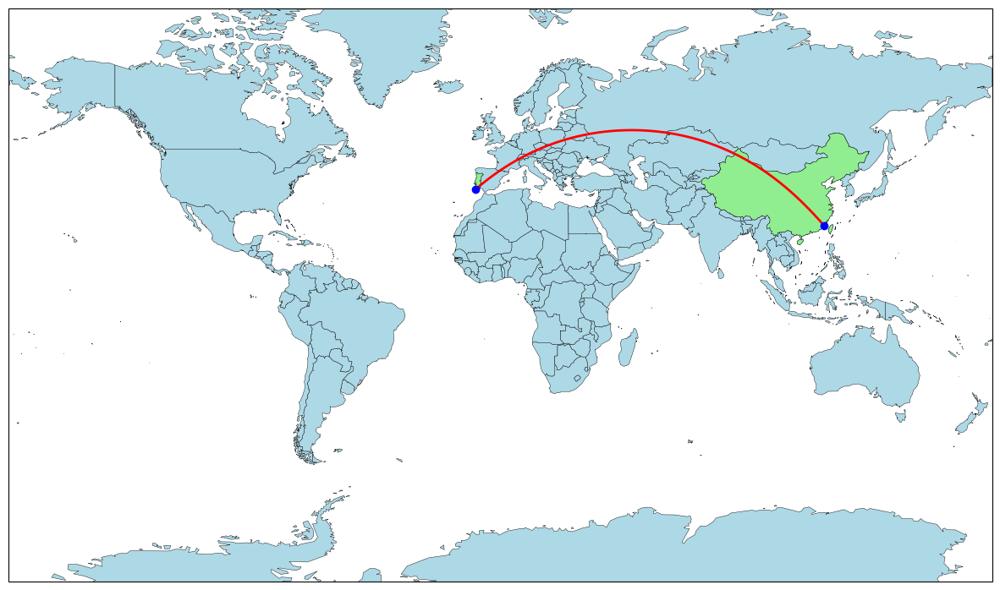

In [130]:
# 最长陆上直线
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from pyproj import Geod

# 读取世界地图数据
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())

# 提取俄罗斯和巴基斯坦的数据
c1 = world[world['name'] == '中国']
c2 = world[world['name'] == '葡萄牙']

# prepare points
# P1
lat1, lon1 = 24.854458453514578, 118.59559070701366
# P1's antipode
lat1a = -lat1
lon1a = lon1 - 180
# p2
lat2, lon2 = 37.01681965305515, -8.940346824854707
# P2's antipode
lat2a = -lat2
lon2a = lon2 - 180


# 创建图形和投影
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
c1.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
c2.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 使用 pyproj 的 Geod 计算大圆弧线
geod = Geod(ellps="WGS84")

# Geodetic lines: P2-P1_antipode
num_points = 200
point = geod.npts(lon2, lat2, lon1, lat1, num_points)
# point1 = geod.npts(lon2, lat2, lon1a, lat1a, num_points)
# Geodetic lines: P1_antipode-P2_antipode
# point2 = geod.npts(lon1a, lat1a, lon2a, lat2a, num_points)
# Geodetic lines: P2_antipode-P1
# point3 = geod.npts(lon2a, lat2a, lon1, lat1, num_points)
# points = point1 + point2 + point3

# 提取较长的一段路径
lons, lats = zip(*point)
# 绘制较长的大圆弧线
ax.plot(lons, lats, color='red', linewidth=2, transform=ccrs.Geodetic())

# 在地图上标记特定的经纬度点
ax.scatter([lon1, lon2], [lat1, lat2], color='b', marker='o', zorder=5, transform=ccrs.PlateCarree())

# 设置图形的外观和保存图像
ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent([180, -180, -80, 80], crs=ccrs.PlateCarree())
plt.savefig('outputM.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# world.json文件求国家形状的对跖点
import json

# Load the GeoJSON file
file_path = './worldmap4/world_transformed.json'
with open(file_path, 'r', encoding='utf-8') as file:
    data = json.load(file)

# Function to find a country's data and transform coordinates
def transform_country(data, country_name, new_country_name):
    for feature in data['features']:
        if feature['properties']['name'] == country_name:
            country = feature
            break
    else:
        return None  # Country not found

    # Transform the coordinates for the country
    def transform_coordinates(coords):
        return [[lon + 180, lat * -1] for lon, lat in coords]

    if country['geometry']['type'] == 'Polygon':
        new_coordinates = [transform_coordinates(ring) for ring in country['geometry']['coordinates']]
    elif country['geometry']['type'] == 'MultiPolygon':
        new_coordinates = [[transform_coordinates(ring) for ring in polygon] for polygon in country['geometry']['coordinates']]

    # Create a new feature for the transformed country
    country_transformed = {
        "type": "Feature",
        "properties": {
            "name": new_country_name,
            "full_name": country['properties'].get('full_name', ''),
            "iso_a2": country['properties'].get('iso_a2', ''),
            "iso_a3": country['properties'].get('iso_a3', ''),
            "iso_n3": country['properties'].get('iso_n3', '')
        },
        "geometry": {
            "type": country['geometry']['type'],
            "coordinates": new_coordinates
        }
    }

    # Add the new feature to the GeoJSON data
    data['features'].append(country_transformed)
    return data

# Transform Chile and add the new record as "智利对"
data = transform_country(data, '智利', '智利对')

# Save the new GeoJSON data to a file
output_path_chile = './worldmap4/world_transformed_chile.json'
with open(output_path_chile, 'w', encoding='utf-8') as output_file:
    json.dump(data, output_file, ensure_ascii=False)



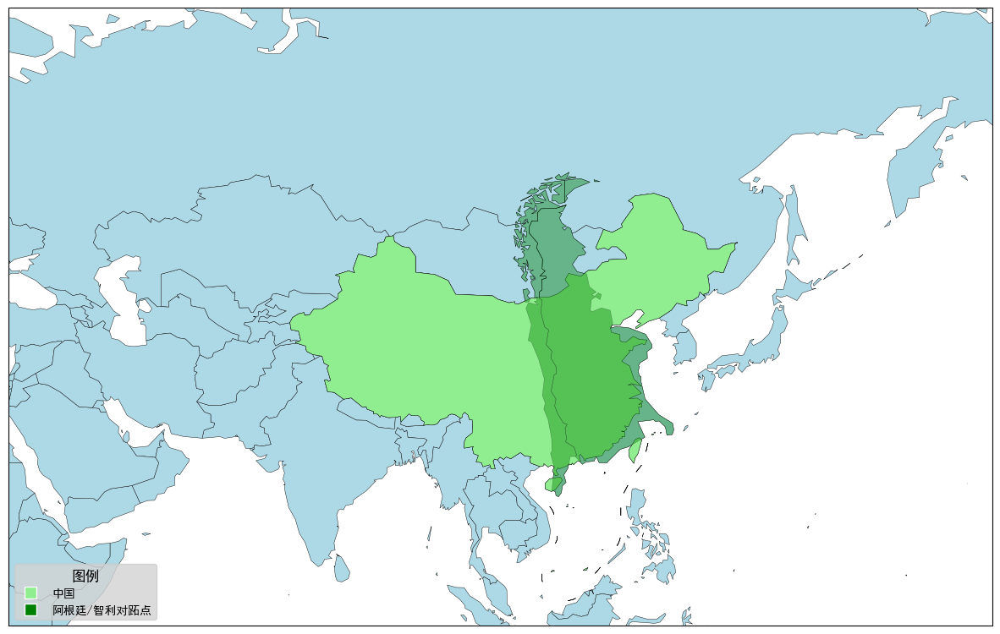

In [153]:
#阿根廷对跖点
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world_antipode.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['中国']

countries_to_fill2 = ['阿根廷对', '智利对']
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=150)})

world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill2:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='green', edgecolor='black', linewidth=0.3, alpha=0.4, transform=ccrs.PlateCarree())



legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='中国', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='阿根廷/智利对跖点', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([35, 170, 70, 0], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()

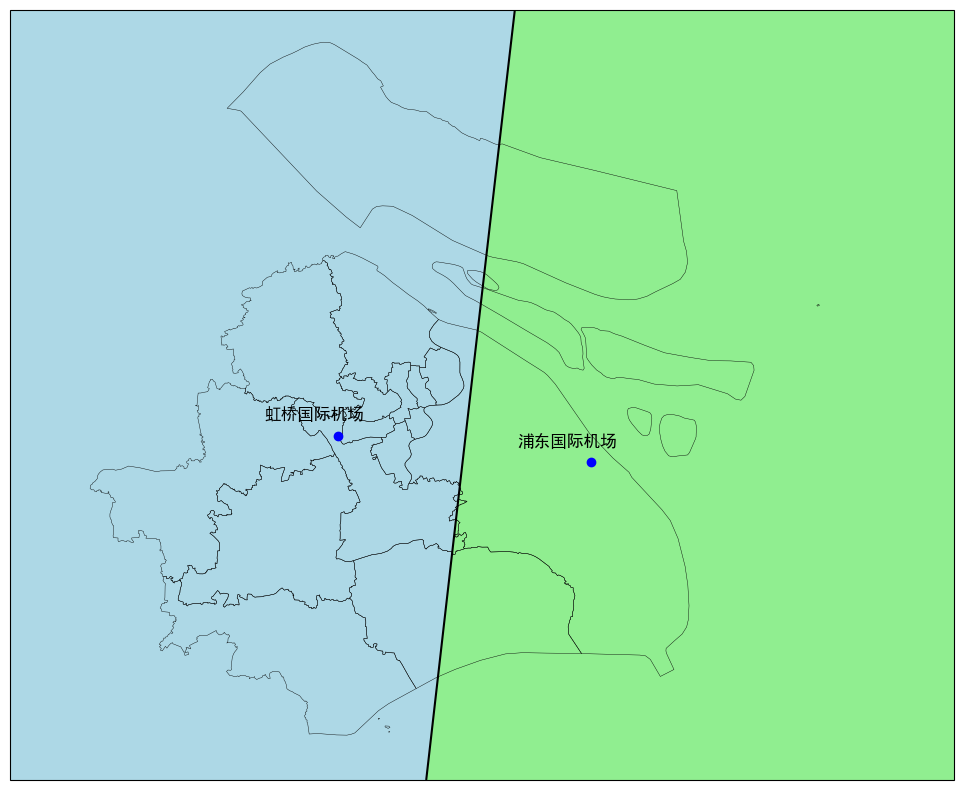

In [10]:
#机场-大比例尺
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from geopy.distance import geodesic
import numpy as np

# data prepare
# 双流/天府
# lat1, lon1, name1 = 30.569778839864615, 103.95590312791185, '双流国际机场'
# lat2, lon2, name2 = 30.313116323266186, 104.44369225050900, '天府国际机场'
# scale = [102.8, 105, 29.93, 31.53]
# 首都/大兴
# lat1, lon1, name1 = 40.081054085660170, 116.60289618916025, '首都国际机场'
# lat2, lon2, name2 = 39.510088104671800, 116.41055148830489, '大兴国际机场'
# scale = [115, 118, 39.3, 41.3]
# 虹桥/浦东
# lat1, lon1, name1 = 31.196370406678966, 121.32436104784608, '虹桥国际机场'
# lat2, lon2, name2 = 31.151172974190693, 121.80677677203800, '浦东国际机场'
# scale = [120.7, 122.5, 30.6, 31.93]

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

chengdu = gpd.read_file('./chinamap/shanghai.json')
chengdu = chengdu.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})

# P1
lat1, lon1, name1 = 31.196370406678966, 121.32436104784608, '虹桥国际机场'
# P2
lat2, lon2, name2 = 31.151172974190693, 121.80677677203800, '浦东国际机场'
# lon lat scale list
scale = [120.7, 122.5, 30.6, 31.93]

# calculate half devided line
lats = np.linspace(scale[2], scale[3], 300)
lons = np.linspace(scale[0], scale[1], 600)
lon_grid, lat_grid = np.meshgrid(lons, lats)
distance_diff = np.zeros(lon_grid.shape)

for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        d1 = geodesic(point, (lat1, lon1)).kilometers
        d2 = geodesic(point, (lat2, lon2)).kilometers
        distance_diff[i, j] = d1 - d2

contourf = ax.contourf(lon_grid, lat_grid, distance_diff, levels=[-1e10, 0, 1e10], colors=['lightblue', 'lightgreen'], transform=ccrs.PlateCarree(), zorder=0)
contour = ax.contour(lon_grid, lat_grid, distance_diff, levels=[0], colors='k', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2], [lat1, lat2], color='b', marker='o', zorder=5, transform=ccrs.PlateCarree())

ax.text(lon1+0.05, lat1+0.05, name1, transform=ccrs.PlateCarree(), fontsize=12, ha='right', va='top', zorder=10)
ax.text(lon2+0.05, lat2+0.05, name2, transform=ccrs.PlateCarree(), fontsize=12, ha='right', va='top', zorder=10)


# draw map
chengdu.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent(scale, crs=ccrs.PlateCarree())

# save and show
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


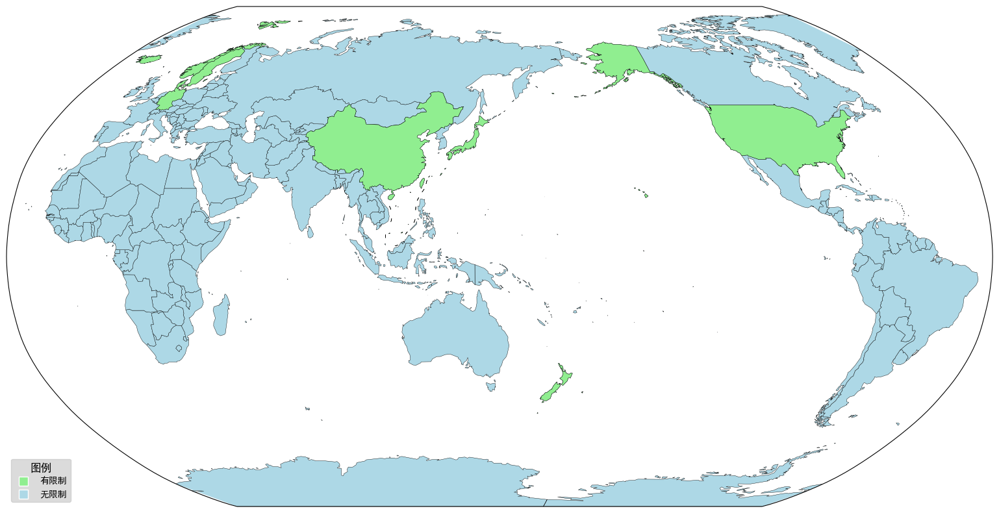

In [16]:
#起名法
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['中国', '日本', '新西兰', '美国', '冰岛', '挪威', '瑞典', '德国', '丹麦']

fig, ax = plt.subplots(1, 1, figsize=(20, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})

world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='有限制', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='无限制', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# ax.set_extent([180, -180, 80, -65], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()

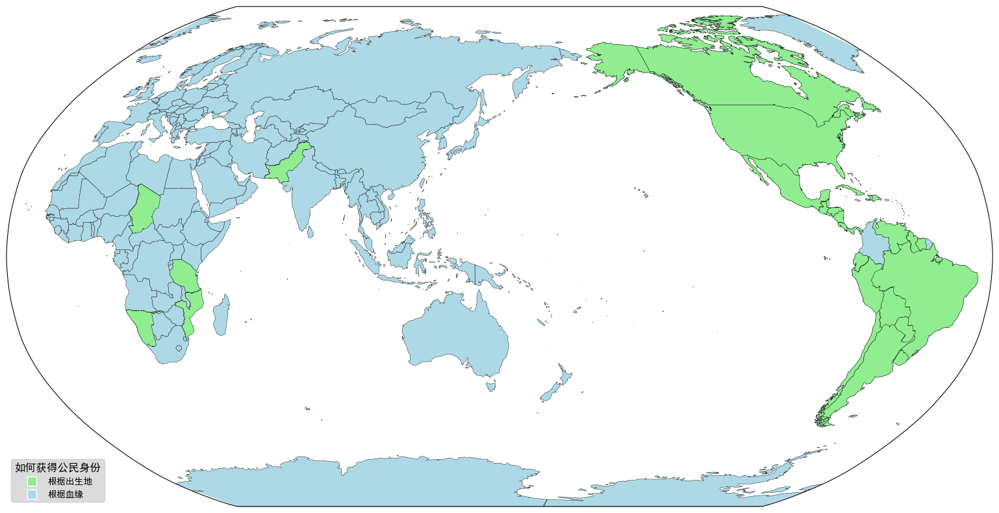

In [2]:
#公民权获取
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['加拿大', '美国', '墨西哥', '危地马拉', '伯利兹', '洪都拉斯', '萨尔瓦多', '尼加拉瓜', '哥斯达黎加',
                      '巴拿马', '海地', '古巴', '多米尼加', '厄瓜多尔', '秘鲁', '玻利维亚', '智利', '阿根廷', '巴西',
                      '乌拉圭', '巴拉圭', '委内瑞拉', '圭亚那', '苏里南', '乍得', '纳米比亚', '坦桑尼亚', '莫桑比克','巴基斯坦']

fig, ax = plt.subplots(1, 1, figsize=(20, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})

world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='根据出生地', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='根据血缘', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='如何获得公民身份', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# ax.set_extent([180, -180, 80, -65], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()

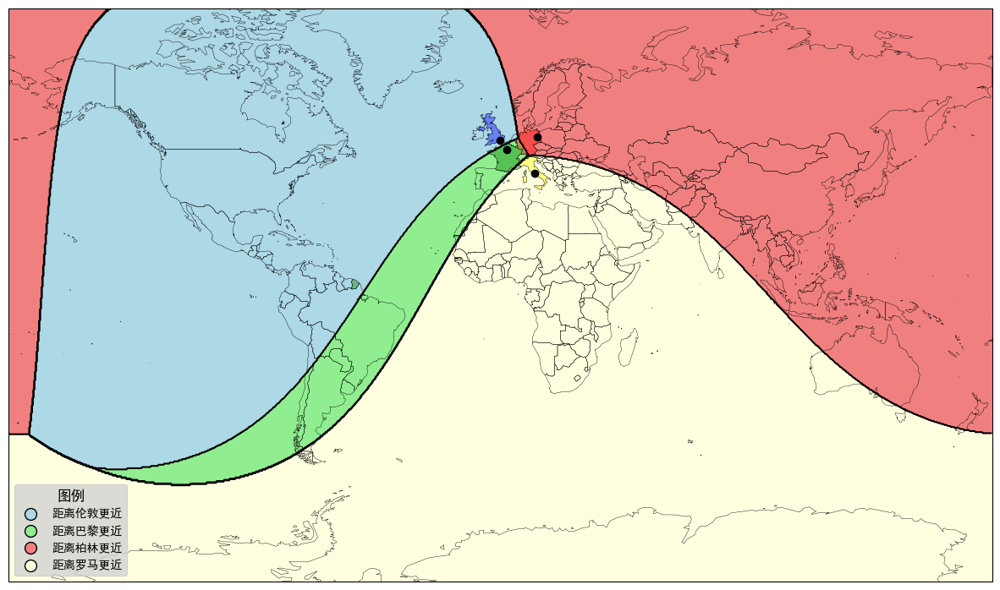

In [11]:
#全球四个点
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from geopy.distance import geodesic
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 
# 读取地图数据
world = gpd.read_file('./worldmap4/world.json')

# 将地图数据转换为 Plate Carrée 投影
world = world.to_crs(ccrs.PlateCarree())

# 选取英国、法国和德国的地理数据
c1 = world[world['name'] == '英国']
c2 = world[world['name'] == '法国']
c3 = world[world['name'] == '德国']
c4 = world[world['name'] == '意大利']

# 创建绘图对象
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})

# 绘制世界地图
world.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 绘制三个国家
c1.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.3, alpha=0.4, transform=ccrs.PlateCarree())
c2.plot(ax=ax, color='green', edgecolor='black', linewidth=0.3, alpha=0.4, transform=ccrs.PlateCarree())
c3.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, alpha=0.4, transform=ccrs.PlateCarree())
c4.plot(ax=ax, color='yellow', edgecolor='black', linewidth=0.3, alpha=0.4, transform=ccrs.PlateCarree())

# 生成经纬度网格
lat1, lon1 = 51.50777890052945, -0.12601613293049535  # 伦敦
lat2, lon2 = 48.857870088293815, 2.3510885557827286   # 巴黎
lat3, lon3 = 52.519704540110595, 13.407949812341089   # 柏林
lat4, lon4 = 41.89713699972998, 12.48495118438565   # 罗马
# lat1, lon1 = 39.90407922493942, 116.3912490206096   # 北京
# lat2, lon2 = 31.240256554284514, 121.49840283827895   # 上海
# lat3, lon3 = 23.122773037588736, 113.26168014603358   # 广州
# lat4, lon4 = 30.658847978781502, 104.06595526381238   # 成都
# lat1, lon1 = 47.609251331603694, -122.33314182466982   # 西雅图
# lat2, lon2 = 42.358255079767990, -71.054566476430380   # 波士顿
# lat3, lon3 = 25.761618408727980, -80.195219885820720   # 迈阿密
# lat4, lon4 = 21.311592704789668, -157.85844146832410   # 檀香山
# lat1, lon1 = 23.399352521949837, 113.30038286405006   # 白云机场
# lat2, lon2 = 22.632993696792287, 113.80534005514157   # 宝安机场
# lat3, lon3 = 22.315490584010796, 113.93473527373236   # 香港机场
# lat4, lon4 = 22.157835356531564, 113.57493379683791   # 澳门机场
lats = np.linspace(-90, 90, 600)
lons = np.linspace(-180, 180, 1200)
lon_grid, lat_grid = np.meshgrid(lons, lats)
nearest_city = np.zeros(lon_grid.shape)

# 计算每个网格点到三个目标点的距离
for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        d1 = geodesic(point, (lat1, lon1)).kilometers
        d2 = geodesic(point, (lat2, lon2)).kilometers
        d3 = geodesic(point, (lat3, lon3)).kilometers
        d4 = geodesic(point, (lat4, lon4)).kilometers
        distances = [d1, d2, d3, d4]
        nearest_city[i, j] = np.argmin(distances)

# 绘制不同区域
contourf = ax.contourf(lon_grid, lat_grid, nearest_city, levels=[-0.5, 0.5, 1.5, 2.5, 3.5], colors=['lightblue', 'lightgreen', 'lightcoral', 'lightyellow'], transform=ccrs.PlateCarree(), zorder=0)
contour = ax.contour(lon_grid, lat_grid, nearest_city, levels=[0.5, 1.5, 2.5], colors='k', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2, lon3, lon4], [lat1, lat2, lat3, lat4], color='black', marker='o', zorder=5, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightblue', markersize=10, label='距离伦敦更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightgreen', markersize=10, label='距离巴黎更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightcoral', markersize=10, label='距离柏林更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightyellow', markersize=10, label='距离罗马更近', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')

# 设置横纵坐标刻度不可见
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 设置地图显示范围
ax.set_extent([180, -180, -80, 80], crs=ccrs.PlateCarree())

# 保存图像并显示
plt.savefig('output3_cities.png', dpi=300, bbox_inches='tight')
plt.show()


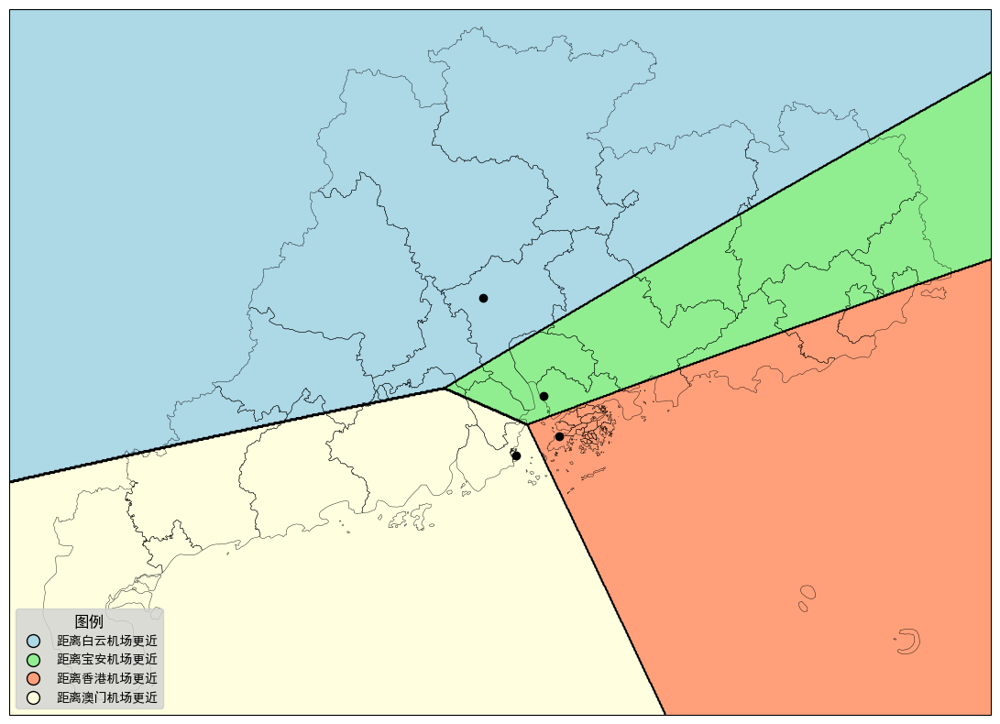

In [5]:
#珠三角四个机场
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from geopy.distance import geodesic
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

guangdong = gpd.read_file('./chinamap/guangdong.json')
hongkong = gpd.read_file('./chinamap/hongkong.json')
macao = gpd.read_file('./chinamap/macao.json')

guangdong = guangdong.to_crs(ccrs.PlateCarree())
hongkong = hongkong.to_crs(ccrs.PlateCarree())
macao = macao.to_crs(ccrs.PlateCarree())

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})

guangdong.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
hongkong.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
macao.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

lat1, lon1 = 23.399352521949837, 113.30038286405006   # 白云机场
lat2, lon2 = 22.632993696792287, 113.80534005514157   # 宝安机场
lat3, lon3 = 22.315490584010796, 113.93473527373236   # 香港机场
lat4, lon4 = 22.157835356531564, 113.57493379683791   # 澳门机场
lats = np.linspace(20.10, 25.66, 600)
lons = np.linspace(109.37, 117.52, 1200)
lon_grid, lat_grid = np.meshgrid(lons, lats)
nearest_city = np.zeros(lon_grid.shape)

for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        d1 = geodesic(point, (lat1, lon1)).kilometers
        d2 = geodesic(point, (lat2, lon2)).kilometers
        d3 = geodesic(point, (lat3, lon3)).kilometers
        d4 = geodesic(point, (lat4, lon4)).kilometers
        distances = [d1, d2, d3, d4]
        nearest_city[i, j] = np.argmin(distances)

contourf = ax.contourf(lon_grid, lat_grid, nearest_city, levels=[-0.5, 0.5, 1.5, 2.5, 3.5], colors=['lightblue', 'lightgreen', 'lightcoral', 'lightyellow'], transform=ccrs.PlateCarree(), zorder=0)
contour = ax.contour(lon_grid, lat_grid, nearest_city, levels=[0.5, 1.5, 2.5], colors='k', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2, lon3, lon4], [lat1, lat2, lat3, lat4], color='black', marker='o', zorder=5, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightblue', markersize=10, label='距离白云机场更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightgreen', markersize=10, label='距离宝安机场更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightcoral', markersize=10, label='距离香港机场更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightyellow', markersize=10, label='距离澳门机场更近', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')

ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 保存图像并显示
plt.savefig('output10.png', dpi=300, bbox_inches='tight')
plt.show()


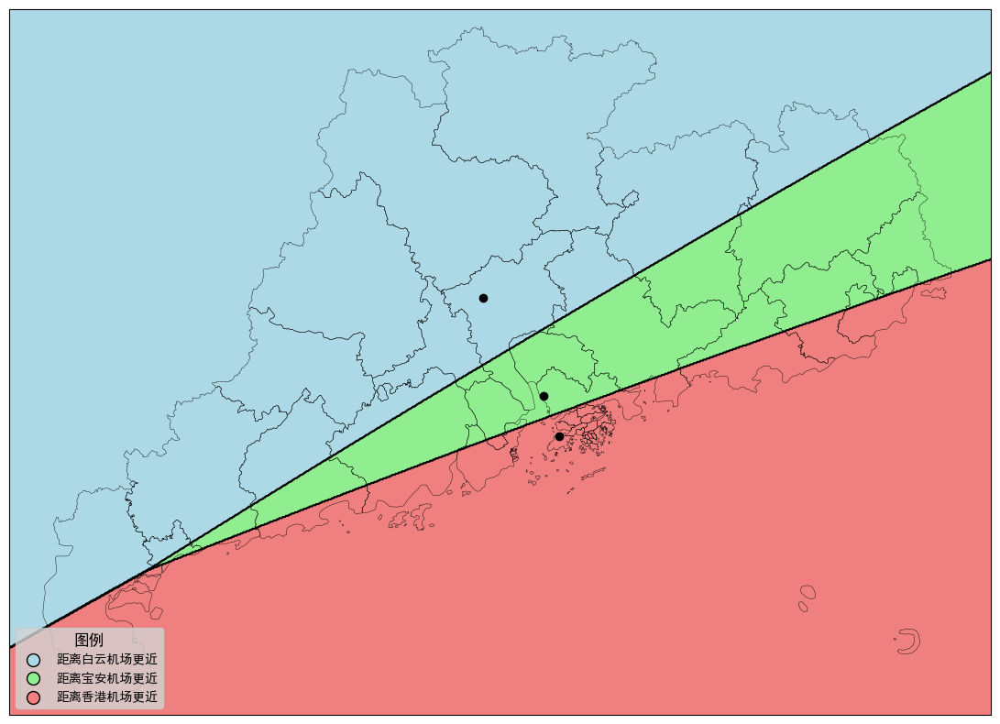

In [9]:
#珠三角三个机场
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from geopy.distance import geodesic
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

guangdong = gpd.read_file('./chinamap/guangdong.json')
hongkong = gpd.read_file('./chinamap/hongkong.json')
macao = gpd.read_file('./chinamap/macao.json')

guangdong = guangdong.to_crs(ccrs.PlateCarree())
hongkong = hongkong.to_crs(ccrs.PlateCarree())
macao = macao.to_crs(ccrs.PlateCarree())

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})

guangdong.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
hongkong.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
macao.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

lat1, lon1 = 23.399352521949837, 113.30038286405006   # 白云机场
lat2, lon2 = 22.632993696792287, 113.80534005514157   # 宝安机场
lat3, lon3 = 22.315490584010796, 113.93473527373236   # 香港机场
lats = np.linspace(20.10, 25.66, 600)
lons = np.linspace(109.37, 117.52, 1200)
lon_grid, lat_grid = np.meshgrid(lons, lats)
nearest_city = np.zeros(lon_grid.shape)

for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        d1 = geodesic(point, (lat1, lon1)).kilometers
        d2 = geodesic(point, (lat2, lon2)).kilometers
        d3 = geodesic(point, (lat3, lon3)).kilometers
        distances = [d1, d2, d3]
        nearest_city[i, j] = np.argmin(distances)

contourf = ax.contourf(lon_grid, lat_grid, nearest_city, levels=[-0.5, 0.5, 1.5, 2.5], colors=['lightblue', 'lightgreen', 'lightcoral', 'lightyellow'], transform=ccrs.PlateCarree(), zorder=0)
contour = ax.contour(lon_grid, lat_grid, nearest_city, levels=[0.5, 1.5], colors='k', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2, lon3], [lat1, lat2, lat3], color='black', marker='o', zorder=5, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightblue', markersize=10, label='距离白云机场更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightgreen', markersize=10, label='距离宝安机场更近', linestyle='None'),
    Line2D([0], [0], marker='o', color='k', markerfacecolor='lightcoral', markersize=10, label='距离香港机场更近', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')

ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 保存图像并显示
plt.savefig('output10.png', dpi=300, bbox_inches='tight')
plt.show()


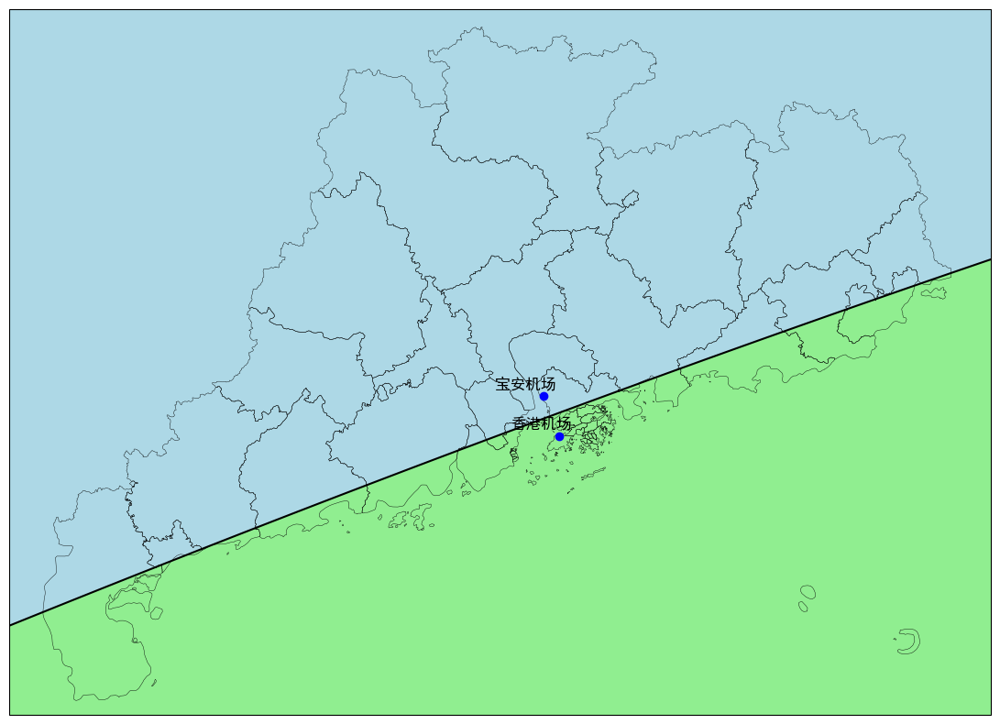

In [18]:
#珠三角两个机场
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from geopy.distance import geodesic
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

guangdong = gpd.read_file('./chinamap/guangdong.json')
hongkong = gpd.read_file('./chinamap/hongkong.json')
macao = gpd.read_file('./chinamap/macao.json')

guangdong = guangdong.to_crs(ccrs.PlateCarree())
hongkong = hongkong.to_crs(ccrs.PlateCarree())
macao = macao.to_crs(ccrs.PlateCarree())

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})

guangdong.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
hongkong.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
macao.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

lat1, lon1, name1 = 22.632993696792287, 113.80534005514157, '宝安机场'
lat2, lon2, name2 = 22.315490584010796, 113.93473527373236, '香港机场' 
lats = np.linspace(20.10, 25.66, 300)
lons = np.linspace(109.37, 117.52, 600)
lon_grid, lat_grid = np.meshgrid(lons, lats)
distance_diff = np.zeros(lon_grid.shape)

for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        d1 = geodesic(point, (lat1, lon1)).kilometers
        d2 = geodesic(point, (lat2, lon2)).kilometers
        distance_diff[i, j] = d1 - d2

contourf = ax.contourf(lon_grid, lat_grid, distance_diff, levels=[-1e10, 0, 1e10], colors=['lightblue', 'lightgreen'], transform=ccrs.PlateCarree(), zorder=0)
contour = ax.contour(lon_grid, lat_grid, distance_diff, levels=[0], colors='k', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2], [lat1, lat2], color='b', marker='o', zorder=5, transform=ccrs.PlateCarree())

ax.text(lon1+0.1, lat1+0.15, name1, transform=ccrs.PlateCarree(), fontsize=12, ha='right', va='top', zorder=10)
ax.text(lon2+0.1, lat2+0.15, name2, transform=ccrs.PlateCarree(), fontsize=12, ha='right', va='top', zorder=10)

ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 保存图像并显示
plt.savefig('output10.png', dpi=300, bbox_inches='tight')
plt.show()


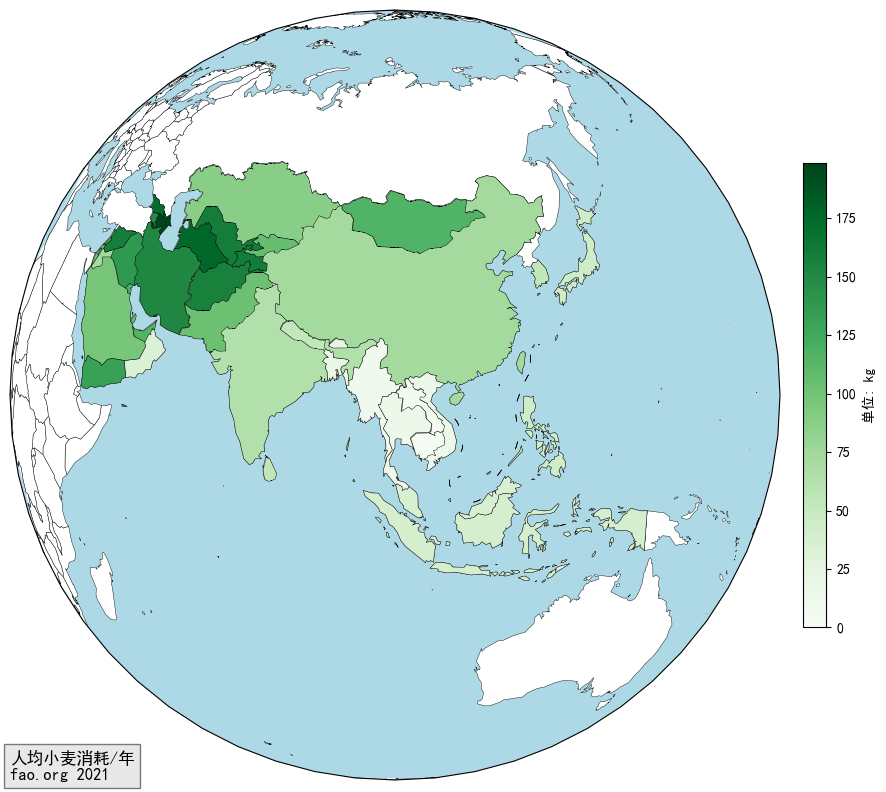

In [3]:
# 渐变色
# 国际粮农组织
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

# 读取世界地图数据
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())

# 定义国家及其对应数值
# countries_data = [{'中国': 128.1}, {'韩国': 83.5}, {'日本': 80}, {'巴基斯坦': 19.7}, {'印度': 108.4}, {'孟加拉国': 268.9}, {'缅甸': 195.5}, {'泰国': 156.5}, {'老挝': 233.5}, 
#                   {'越南': 212.9}, {'柬埔寨': 245.9}, {'马来西亚': 111.9}, {'印度尼西亚': 180.1}, {'菲律宾': 195.2}, {'东帝汶': 114.2}, {'斯里兰卡': 170.3}, {'尼泊尔': 138.7}, 
#                   {'阿富汗': 15.2}, {'伊朗': 40.3}, {'伊拉克': 50.9}, {'科威特': 52}, {'沙特阿拉伯': 53.3}, {'也门': 28.6}, {'阿曼': 51.1}, {'阿联酋': 26.8}, {'蒙古': 8},
#                   {'哈萨克斯坦': 11.8}, {'乌兹别克斯坦': 9.2}, {'土库曼斯坦': 19.9}, {'吉尔吉斯斯坦': 5.5}, {'塔吉克斯坦': 13.5}, {'叙利亚': 10.5}, {'黎巴嫩': 12.5}, {'以色列': 16.9}]

countries_data = [{'阿富汗': 156.17}, {'亚美尼亚': 148.23}, {'阿塞拜疆': 198.86}, {'巴林': 77.02}, {'孟加拉国': 18.14}, {'不丹': 23.28}, {'柬埔寨': 4.01}, {'中国': 72.77}, {'格鲁吉亚': 173.12}, 
                  {'印度': 64.08}, {'印度尼西亚': 39.22}, {'伊朗': 151.98}, {'伊拉克': 138.05}, {'以色列': 102.01}, {'日本': 42.26}, {'约旦': 71.8}, {'哈萨克斯坦': 88.37}, 
                  {'科威特': 116.93}, {'吉尔吉斯斯坦': 106.14}, {'老挝': 6.47}, {'黎巴嫩': 127.13}, {'马来西亚': 36}, {'蒙古': 116.7}, {'缅甸': 10.68}, {'尼泊尔': 53.77}, {'阿曼': 34.22},
                  {'巴基斯坦': 103.98}, {'菲律宾': 42.7}, {'卡塔尔': 107.52}, {'韩国': 54.21}, {'沙特阿拉伯': 97.56}, {'斯里兰卡': 54.86}, {'叙利亚': 159.53}, {'塔吉克斯坦': 161.51}, 
                  {'泰国': 13.56}, {'东帝汶': 27.7}, {'土库曼斯坦': 176.15}, {'阿联酋': 116.53}, {'乌兹别克斯坦': 160.05}, {'越南': 15.43}, {'也门': 131.48}]

# 提取国家名和数值
countries_to_fill = [list(item.keys())[0] for item in countries_data]
values = [list(item.values())[0] for item in countries_data]

# 创建一个红色渐变色
colors = plt.cm.Greens(np.linspace(0, 1, 100))
cmap = mcolors.LinearSegmentedColormap.from_list('custom_red', colors)

# 自定义归一化范围，使颜色更明显
norm = mcolors.Normalize(vmin=0, vmax=max(values))  # 将vmin设为0

# 绘制地图
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Orthographic(central_longitude=100, central_latitude=20)})
ax.set_facecolor('lightblue')
world.plot(ax=ax, color='white', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


# 遍历每个国家并填充颜色
for country, value in zip(countries_to_fill, values):
    country_data = world[world['name'] == country]
    if not country_data.empty:
        color = cmap(norm(value))
        country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 移除刻度
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 添加颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.02)
cbar.set_label('单位: kg')

plt.text(0, 0, '人均小麦消耗/年\nfao.org 2021', transform=ax.transAxes, fontsize='large', bbox=dict(facecolor='lightgray', alpha=0.5))

# 保存和显示图片
# plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


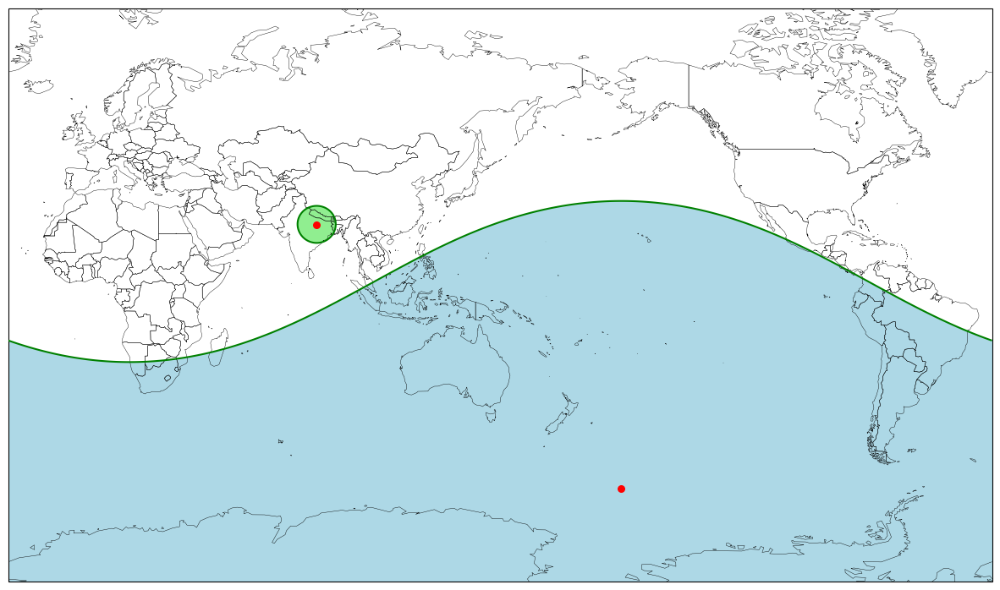

In [1]:
# 十亿人口圈
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import Point
import numpy as np
from geopy.distance import geodesic

# 读取世界地图数据
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())

# 创建一个图形和一个轴，使用Miller投影，中心经度为0°
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=150)})
world.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# 定义点P1和点P2的经纬度
longitude1, latitude1 = 82.8083, 25.2167
longitude2, latitude2 = -165.658, -61.5917
points = [Point(longitude1, latitude1), Point(longitude2, latitude2)]
gdf = gpd.GeoDataFrame(index=[0, 1], crs=ccrs.PlateCarree(), geometry=points)

# 绘制点P1和点P2
gdf.plot(ax=ax, color='red', markersize=30, transform=ccrs.PlateCarree())

lats = np.linspace(-90, 90, 300)
lons = np.linspace(-180, 180, 600)
lon_grid, lat_grid = np.meshgrid(lons, lats)
distance_diff1 = np.zeros(lon_grid.shape)
distance_diff2 = np.zeros(lon_grid.shape)

# 计算每个网格点到目标点的球面距离
for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        distance_diff1[i, j] = geodesic(point, (latitude1, longitude1)).kilometers
        distance_diff2[i, j] = geodesic(point, (latitude2, longitude2)).kilometers

# 绘制等高线填充颜色
contourf1 = ax.contourf(lon_grid, lat_grid, distance_diff1, levels=[-1e10, 705, 1e10], colors=['lightgreen', 'none'], transform=ccrs.PlateCarree(), zorder=0)
contour1 = ax.contour(lon_grid, lat_grid, distance_diff1, levels=[705], colors='green', transform=ccrs.PlateCarree(), zorder=3)
contourf2 = ax.contourf(lon_grid, lat_grid, distance_diff2, levels=[-1e10, 10505, 1e10], colors=['lightblue', 'none'], transform=ccrs.PlateCarree(), zorder=0)
contour2 = ax.contour(lon_grid, lat_grid, distance_diff2, levels=[10505], colors='green', transform=ccrs.PlateCarree(), zorder=3)

# 移除刻度参数
ax.set_extent([180, -180, -80, 80], crs=ccrs.PlateCarree())
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 显示绘图
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


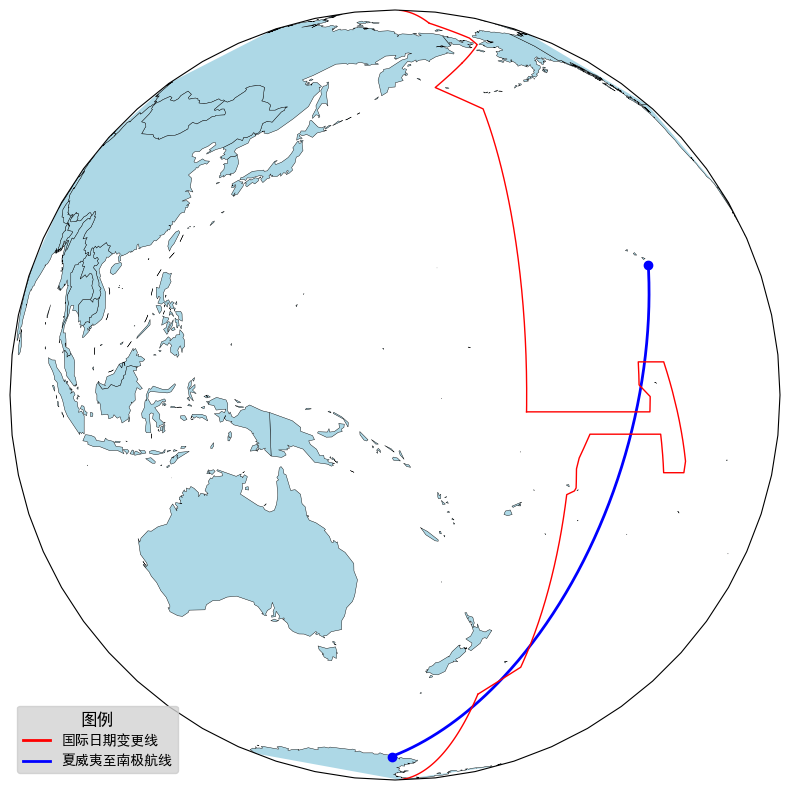

In [23]:
# 国际日期变更线
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from pyproj import Geod

l1 = '180.000000335276 89.99999550842358,180.00000032410026 89.49999566326517,180.00000031292427 88.99999581810658,180.0000003017485 88.49999597294794,180.00000029057253 87.99999612778953,180.00000027939677 87.49999628263112,180.0000002682208 86.99999643747253,180.00000025704503 86.49999659231406,180.00000024586905 85.99999674715548,180.00000023469318 85.49999690199706,180.00000022351742 84.99999705683842,180.00000021234143 84.49999721168001,180.00000020116568 83.99999736652143,180.0000001899897 83.49999752136296,180.00000017881393 82.99999767620454,180.00000016763795 82.49999783104596,180.00000015646208 81.99999798588732,180.00000014528632 81.4999981407289,180.00000013411034 80.99999829557049,180.00000012293458 80.49999845041191,180.0000001117586 79.99999860525344,180.00000010058284 79.49999876009485,180.00000008940685 78.99999891493644,180.0000000782311 78.4999990697778,180.0000000670551 77.99999922461939,180.00000005587924 77.4999993794608,180.00000004470348 76.99999953430233,180.0000000335275 76.49999968914392,180.00000002235174 75.99999984398534,180.00000001117576 75.4999999988267,180 75.00000015366828'
l2 = '-180.00000000000006 75.00000015366829,-179.6093818493981 74.75190081654415,-179.12602086158938 74.51465868349989,-178.72949210943193 74.29155276784286,-178.324743879806 74.06120394629717,-177.99763309082778 73.87317322657239,-177.6485901317715 73.67106359989562,-177.28734002795892 73.4602869004422,-176.69891496023766 73.11299363213408,-176.29880544561854 72.8743439521546,-175.91761700537137 72.64497170218925,-175.44349150304868 72.35684239546536,-175.0017556248117 72.08543687705702,-174.59485079961186 71.8327082901254,-174.1324848467375 71.542422387828,-173.66035317805796 71.24208593634786,-173.07030049103582 70.86118232947835,-172.7271576519447 70.63616396114291,-172.25929848393008 70.32532936517276,-171.7887537440691 70.00765876813912,-171.4737280283994 69.79191782981833,-171.1367294521689 69.55843584111862,-170.88965684230752 69.38391436159048,-170.44043391528703 69.06286645450777,-170.13041312896718 68.83727841941692,-169.69848365701765 68.51623051233447,-169.3898925456742 68.24811314738008,-168.9999999897555 68.00000014714902,-168.9999999897555 67.58333348009444,-168.9999999897556 67.16666681303968,-168.9999999897556 66.75000014598487,-168.99999998975568 66.33333347893029,-168.99999998975568 65.91666681187553,-168.99999998975568 65.50000014482072,-169.41717540941406 65.308653958994,-169.83435082907243 65.11730777316711,-170.25171145735928 64.88204144702736,-170.63306265953656 64.69291208427448,-171.0602720355138 64.47729321740115,-171.5326071566058 64.23608003702259,-171.8261482975049 64.08430453722318,-172.3313206379905 63.82136263917899,-172.60732418092348 63.67687073575051,-173.17853717453866 63.37425561724952,-173.48339026957868 63.210883329931676,-173.78596469759734 63.048487614194514,-174.42842672610516 62.699729488515835,-174.76025761105566 62.51731405537877,-175.10482461703475 62.32781847828312,-175.4665630066373 62.12660404222174,-175.7621793621451 61.962092421393635,-176.1718104496736 61.73190636177813,-176.3802677916236 61.61410741488279,-176.7450172769327 61.40678940644341,-177.12087526396974 61.19206573018547,-177.38279989995095 61.0418364687216,-177.59272209927147 60.920538140329526,-177.9527107981258 60.7119180364497,-178.20486971830215 60.565228846965184,-178.6270334744469 60.31795278469137,-178.80887924082853 60.210651982286045,-179.0563180650326 60.06477660245177,-179.49264210909453 59.80561891928223,-179.9999710451536 59.50186446727048'
l3 = '179.99967354891336 59.50186446727049,179.61392777462385 59.26939974063383,179.41356783869549 59.14785726934673,178.9379774790021 58.858222414769365,178.69464839353236 58.709539391641464,178.50144998252767 58.59064180171805,178.22556851104224 58.42071834671457,178.0305797188063 58.29978623266521,177.54294497628698 57.99631661403129,177.26934217182253 57.82529451599964,177.03756918338877 57.67941913616562,176.7823584770235 57.518691730211664,176.50143138570536 57.340426726291696,176.0567657927272 57.057180277469996,175.79211489441718 56.88794856066948,175.5907783869084 56.75830868336078,175.2888550066101 56.56376748643279,175.07604378303063 56.42586744117262,174.78046811800544 56.23368629223072,174.26711699053342 55.897786359028146,174.0086510455665 55.72761876112963,173.74896438612393 55.55598630586044,173.48805701220587 55.38288899322052,173.22617306670725 55.20832682320971,172.96298702576792 55.03229979582816,172.69866165131822 54.854848601558615,172.4333597052879 54.675891859435765,172.1669998067121 54.49547025994222,171.89966333655596 54.31362449356052,171.63110615192394 54.13035456029037,171.3615723957116 53.94557907916716,171.09106206791878 53.759420121638165,170.81973793047567 53.57171492577363,170.5473558404869 53.3825448725381,170.2739971789176 53.191950652414484,169.99966194576783 52.999932265402755,170.48737806925226 52.765677157535215,170.79988097500595 52.61512237221129,171.33943677322074 52.3536860220204,171.7344599775247 52.16126073018341,172.06275079049595 52.00073677664204,172.6840130776109 51.69629058642772,172.9670560740199 51.55716982669183,173.3544294676103 51.365843177882915,173.68125542321073 51.204424033726205,174.45356078143985 50.820916235975325,174.8597331779544 50.61831832350836,175.27843824308493 50.40884371949541,175.70894354814644 50.192899328762024,176.15043528348812 49.97060722275524,176.60234378235506 49.742292925335654,177.06409937799188 49.50828196036319,177.53472549881798 49.26881847073308,178.01381524000809 49.024227980305476,178.31282702646087 48.87094693827025,178.75261405028456 48.6449843095202,179.1920327884419 48.418429622040364,179.56044068606343 48.21944192185788,180 48.00000029616075,180.000000335276 48.00000012852257,180.0000003318895 47.50505063227496,180.0000003285029 47.010101136027174,180.00000032511628 46.51515163977956,180.00000032172966 46.02020214353172,180.00000031834304 45.525252647284105,180.00000031495642 45.03030315103649,180.0000003115698 44.53535365478871,180.0000003081832 44.040404158541094,180.00000030479657 43.54545466229331,180.00000030140995 43.05050516604564,180.0000002980231 42.555555669797855,180.00000029463672 42.06060617355024,180.00000029124988 41.56565667730246,180.00000028786326 41.07070718105484,180.00000028447664 40.575757684807,180.00000028109002 40.08080818855939,180.0000002777034 39.585858692311604,180.0000002743169 39.09090919606399,180.0000002709303 38.595959699816206,180.00000026754367 38.10101020356859,180.00000026415705 37.60606070732075,180.0000002607702 37.11111121107314,180.00000025738382 36.61616171482552,180.00000025399697 36.12121221857774,180.00000025061036 35.626262722330125,180.00000024722374 35.131313226082284,180.00000024383712 34.63636372983467,180.0000002404505 34.141414233586886,180.0000002370639 33.64646473733927,180.00000023367727 33.15151524109149,180.00000023029065 32.656565744843874,180.00000022690404 32.16161624859603,180.00000022351742 31.66666675234842,180.00000022013091 31.171717256100806,180.00000021674418 30.67676775985302,180.00000021335768 30.181818263605408,180.00000020997084 29.686868767357566,180.00000020658422 29.191919271109953,180.0000002031976 28.69696977486217,180.00000019981098 28.202020278614555,180.00000019642437 27.70707078236677,180.00000019303775 27.212121286119157,180.00000018965113 26.717171789871315,180.00000018626451 26.2222222936237,180.0000001828779 25.727272797376088,180.00000017949128 25.232323301128304,180.00000017610466 24.73737380488052,180.00000017271805 24.24242430863285,180.00000016933143 23.747474812385065,180.0000001659448 23.25252531613745,180.0000001625582 22.757575819889837,180.00000015917146 22.262626323642053,180.00000015578485 21.76767682739444,180.00000015239823 21.272727331146598,180.0000001490116 20.777777834898984,180.000000145625 20.2828283386512,180.00000014223838 19.787878842403586,180.00000013885176 19.292929346155802,180.00000013546514 18.79797984990813,180.00000013207853 18.303030353660347,180.0000001286919 17.808080857412733,180.0000001253053 17.31313136116512,180.00000012191867 16.818181864917335,180.00000011853206 16.32323236866972,180.00000011514544 15.82828287242188,180.00000011175882 15.333333376174267,180.0000001083722 14.838383879926482,180.00000010498547 14.343434383678868,180.00000010159886 13.848484887431084,180.00000009821213 13.353535391183414,180.00000009482562 12.85858589493563,180.0000000914389 12.363636398688016,180.0000000880524 11.868686902440402,180.00000008466577 11.373737406192618,180.00000008127915 10.878787909945004,180.00000007789254 10.383838413697163,180.00000007450592 9.888888917449549,180.0000000711193 9.393939421201765,180.00000006773269 8.89898992495415,180.00000006434607 8.404040428706367,180.00000006095922 7.909090932458696,180.00000005757283 7.414141436210912,180.000000054186 6.919191939963298,180.00000005079937 6.424242443715684,180.00000004741275 5.9292929474679,180.00000004402614 5.434343451220059,180.00000004063952 4.939393954972445,180.0000000372529 4.444444458724831,180.0000000338664 3.949494962477047,180.00000003047978 3.4545454662294333,180.00000002709317 2.959595969981649,180.00000002370632 2.4646464737339784,180.00000002031993 1.969696977486194,180.0000000169331 1.4747474812385803,180.00000001354647 0.9797979849907961,180.00000001015985 0.4848484887431823,180.00000000677323 -0.0101010075045451,180.00000000338662 -0.5050505037522726,179.9999959436228 -1.016266633357443,179.9999917772833 -1.5409030518859672,179.99998813173622 -1.9999599180984258,179.99998416034828 -2.5000475189551516'
l4 = '-179.99997104515307 -2.5094335128363072,-179.52243587869717 -2.509433512608187,-178.9807967829974 -2.5094335123494447,-178.50686257424397 -2.5094335121230444,-178.03292836550668 -2.5094335118966447,-177.52514171328818 -2.509433511654073,-177.0173550610535 -2.5094335114115016,-176.50956840885115 -2.5094335111689303,-175.90022442618894 -2.509433510877845,-175.42629021745165 -2.5094335106514447,-174.98620845216328 -2.5094335104412164,-174.51227424345836 -2.509433510214816,-173.97063514774243 -2.5094335099560734,-173.46284849566948 -2.5094335097135025,-172.95506184337012 -2.509433509470931,-172.51498007804938 -2.5094335092607025,-172.00719342583085 -2.509433509018131,-171.46555433021973 -2.5094335089821302,-171.02547256495367 -2.509433509112815,-170.5176859127452 -2.509433509263605,-170.00989926051665 -2.509433509414395,-169.53596505175923 -2.5094335095551323,-168.96047351260842 -2.509433509726027,-168.4526868603598 -2.5094335098768172,-167.94490020817142 -2.5094335100276073,-167.3567705984319 -2.509433510202255,-166.73344279716918 -2.5094335103873555,-166.22698895864679 -2.50943351053775,-165.68157713258094 -2.5094335106997123,-165.12642580958004 -2.509433510864568,-164.63945096484676 -2.5094335110091777,-164.07456014498024 -2.5094335111769253,-163.50966932506745 -2.509433511344672,-162.96425749897267 -2.509433511506635,-162.43832466669016 -2.5094335116628135,-161.89291284057802 -2.5094335118247764,-161.38645900207877 -2.5094335119751703,-160.88000516355063 -2.509433512125564,-160.37355132503404 -2.5094335122759586,-159.9060554740841 -2.509433512414784,-159.4969966045188 -2.509433512536256,-159.04897974735795 -2.509433512669297,-158.4865713546375 -2.5094335128363072,-158.48657135463745 -1.932251930971415,-158.48657135463742 -1.445277086243941,-158.48657135463736 -1.0167392228837562,-158.4865713546373 -0.6271593471017605,-158.48657135463728 -0.2280734046349116,-158.94327470606876 0.1380689831919038,-159.33017869792837 0.4482527184222082,-159.63162653355062 0.6899256336613725,-159.9900114000082 0.9772453793003794,-160.2891079468391 1.2170332492692972,-160.639768712542 1.498160527335493,-160.63976871261212 1.9830258206328324,-160.63976871268812 2.5089586529469585,-160.63976871275855 2.9959334976800713,-160.63976871283455 3.5218663299773003,-160.6397687129134 4.067278156074896,-160.63976871297817 4.515295013226993,-160.6397687130392 4.937315428082729,-160.0034504430375 4.937315428082729,-159.47751761073184 4.937315428082729,-158.99054276600435 4.937315428082729,-158.50356792127687 4.937315428082729,-157.9971140827603 4.937315428082729,-157.4906602442437 4.937315428082728,-156.98420640572715 4.937315428082728,-156.47775256721056 4.937315428082728,-156.01999621316673 4.937315428082729,-155.52863393116675 4.937315428082729,-155.34358244032686 4.440358715492633,-155.1566113010309 3.9382467772854404,-154.94815780081225 3.3784438504008,-154.74207633449288 2.8250110325239715,-154.56222129689453 2.3420094213402036,-154.40073059362982 1.9083253226925394,-154.22812571355882 1.4447940461393745,-154.04915072448006 0.9641558096963392,-153.89003205511452 0.5368418200564724,-153.72426372574768 0.0687288740796816,-153.55187136875537 -0.3712904098300092,-153.3649002294594 -0.8734023480371955,-153.17318502236498 -1.3882545042600145,-152.9982081083948 -1.8581558898209662,-152.82397718711445 -2.3260539082484093,-152.6457481907255 -2.8046887775578933,-152.44529084072406 -3.343018002678394,-152.2710599194437 -3.8109160211058204,-152.11993740029536 -4.216756308981527,-151.95282258071265 -4.665544000385537,-151.80644412936277 -5.058644070245614,-151.65206952779567 -5.473217841869862,-151.47472057992624 -5.949489336438642,-151.30523372644433 -6.404647136850451,-151.13100280516397 -6.872545155277875,-150.97574815507735 -7.289482301642839,-150.81513750033213 -7.7208030255497775,-150.6019399323151 -8.293346170450048,-150.38474428918946 -8.876626166232372,-150.17466474776148 -9.440795834991272,-150.00023316037058 -9.90923274327129,-150.00016801218877 -10.50025628547553,-150.00019926131836 -11.000177884848654,-150.00023316120186 -11.645359271235485,-150.62431493358625 -11.645359271235485,-151.15024776589192 -11.645359271235485,-151.59826462304122 -11.645359271235485,-152.10471846155778 -11.645359271235485,-152.61117230007437 -11.645359271235485,-153.11762613859096 -11.645359271235485,-153.64355897089663 -11.645359271235485,-154.0915758280459 -11.645359271235485,-154.56615865556606 -11.645359271235485,-154.69737191344396 -11.142520356713785,-154.81676110369585 -10.684993946633012,-154.92187359344564 -10.282179085518584,-155.03753735129658 -9.838929375939893,-155.1567181985145 -9.38220138353979,-155.26658958843166 -8.961149339436588,-155.39425476821796 -8.471907463545627,-155.50991852606887 -8.028657753966943,-155.62206519455276 -7.598886327209675,-155.74000423097038 -7.146917234976939,-155.86539413218998 -6.666394741740031,-155.97629898987353 -6.241382215150122,-156.08043825517493 -5.842296970487039,-156.5387116600836 -5.842296970543612,-157.06332167659238 -5.842296970608372,-157.71283883987974 -5.842296970688552,-158.3123931444673 -5.842296970762565,-158.9119474490457 -5.8422969708365775,-159.5614646123484 -5.842296970916758,-160.21098177564807 -5.842296970996939,-160.8604989389416 -5.842296971077118,-161.48503467288367 -5.842296971154215,-162.13455183618024 -5.842296971234395,-162.73410614074317 -5.842296971308407,-163.30867901598248 -5.842296971379337,-163.9332147499215 -5.842296971456433,-164.632694771927 -5.84229697154278,-165.3321747939449 -5.842296971629128,-165.93172909851705 -5.84229697170314,-166.55626483245612 -5.842296971780238,-167.08087484895873 -5.842296971844998,-167.6804291535401 -5.84229697191901,-168.2799834581278 -5.842296971993024,-168.8795377627154 -5.842296972067036,-169.3960784865953 -5.842296972130801,-169.62507785291177 -6.35660891369496,-169.84589895245523 -6.8525532050322955,-170.07078561618377 -7.357628387180476,-170.32250417147964 -7.9229655799612555,-170.5494912380281 -8.432758077575215,-170.76306235879287 -8.912419569872858,-170.99278789473252 -9.428362422975272,-171.10019629681767 -10.009622299589058,-171.18151071292272 -10.449669880174843,-171.29378558833838 -11.057265552059103,-171.24930411675018 -11.50294873519149,-171.19851260561944 -12.011855512521727,-171.1518074190982 -12.479819261344975,-171.10374265244792 -12.961405356236922,-171.0570374659267 -13.429369105060173,-171.00328719125883 -13.967921285392412,-171.23670082511237 -14.430983758804853,-171.61975036496315 -14.603559135697955,-172.01754249584656 -14.782776494734737,-172.49998268803537 -15.000130359793022,-172.49998268803571 -15.531222537643785,-172.49998268803571 -16.06255885838963,-172.49998268803571 -16.39438269732112,-172.50000834762596 -16.85032831923978,-172.49998268803571 -17.285565042578842,-172.49998268803571 -17.656323677732257,-172.49998268803571 -18.187497236548083,-172.49998268803571 -18.718833557293937,-172.49998268803571 -19.24992573514479,-172.49998268803571 -19.78126205589066,-172.49998268803571 -20.31259837663658,-172.49998268803571 -20.663767886230215,-172.49998268803571 -21.11972164426905,-172.49998268803571 -21.59640057312783,-172.50002337851834 -22.00060235349548,-172.49998268803571 -22.437455373830048,-172.49998268803571 -22.968873075540913,-172.49998268803571 -23.499965253391768,-172.49998268803571 -24.00005128356237,-172.4999826880357 -24.4668367316905,-172.49998268803571 -24.999979201008337,-172.49998268803571 -25.440919760228013,-172.49998268803571 -26.000151261349433,-172.4999826880357 -26.37355244712563,-172.49998268803571 -27.000079178795485,-172.4999826880357 -27.389085817303034,-172.49998268803571 -27.999925715276312,-172.4999826880357 -28.425344358300386,-172.49998268803571 -28.819122603879382,-172.49998268803571 -29.23634671712846,-172.49998268803571 -29.83465597405679,-172.49998268803571 -30.35278524455547,-172.49998268803571 -30.937534410323924,-172.49998268803574 -31.316505687683012,-172.49998268803571 -31.875043127584203,-172.49998268803571 -32.29058871622052,-172.49998268803571 -32.81247046387958,-172.49998268803571 -33.28539691557798,-172.49998268803571 -33.75006056210494,-172.49998268803574 -34.218029602475596,-172.49998268803571 -34.68756927936531,-172.49998268803571 -35.1921126310131,-172.49998268803571 -35.62491523469564,-172.49998268803571 -36.20764600119051,-172.49998268803571 -36.56250533292097,-172.49998268803571 -37.181729029728025,-172.49998268803571 -37.68949571481673,-172.49998268803571 -38.16617464367551,-172.49998268803571 -38.62212840171434,-172.49998268803574 -39.14025767221302,-172.49998268803571 -39.679112113531644,-172.49998268803571 -40.11434070075053,-172.49998268803571 -40.63246997124921,-172.49998268803571 -41.24996753825775,-172.49998268803571 -41.62727817060667,-172.49998268803571 -42.18747625551806,-172.49998268803571 -42.60136119914418,-172.49998268803571 -43.12506635374355,-172.49998268803571 -43.57544422768169,-172.49998268803571 -44.06241230907372,-172.49998268803571 -44.547170091351106,-172.49998268803571 -45.000002407299114,-172.86689700070133 -45.293814163530286,-173.23785131828305 -45.59088902920324,-173.5714028935483 -45.85794075848945,-173.90624576392617 -46.12590805862702,-174.3749594320739 -46.50131845035642,-174.7081874738896 -46.768109133257866,-175.16252364519994 -47.13190631769315,-175.5811187084202 -47.46713012276399,-176.05762649442528 -47.84865401319251,-176.37586513614897 -48.10343253146634,-176.71873122522487 -48.37796350417781,-177.04631862336407 -48.640283684786894,-177.45303057494647 -48.96597314146773,-177.8240200561051 -49.26299691201707,-178.22907111596393 -49.587228227563244,-178.59374865974553 -49.879198166270044,-178.93694852025067 -50.154079832475546,-179.318148001907 -50.45933465670629,-179.69421442579434 -50.76044895305493,-179.9999710451536 -51.00526657952802'
l5 = '180.00125809707686 -51.003774291230535,180.0033129137219 -51.49551639693058,180 -51.999999906277594,180 -52.49999984841105,180 -52.99999979054451,180 -53.49999973267808,180 -53.99999967481159,180 -54.49999961694505,180 -54.99999955907856,180 -55.49999950121202,180 -55.99999944334559,180 -56.49999938547904,180 -56.99999932761256,180 -57.49999926974601,180 -57.99999921187958,180 -58.49999915401304,180 -58.99999909614655,180 -59.49999903828001,180 -59.99999898041358,180 -60.499998922547036,180 -60.999998864680606,180 -61.499998806814006,180 -61.999998748947576,180 -62.49999869108103,180 -62.9999986332146,180 -63.499998575348,180 -63.99999851748157,180 -64.49999845961503,180 -64.9999984017486,180 -65.49999834388211,180 -65.99999828601557,180 -66.49999822814902,180 -66.99999817028254,180 -67.499998112416,180 -67.99999805454956,180 -68.49999799668308,180 -68.99999793881653,180 -69.4999978809501,180 -69.99999782308356,180 -70.49999776521707,180 -70.99999770735053,180 -71.49999764948399,180 -71.99999759161756,180 -72.49999753375107,180 -72.99999747588453,180 -73.4999974180181,180 -73.99999736015155,180 -74.49999730228507,180 -74.99999724441852,180 -75.4999971865521,180 -75.9999971286855,180 -76.49999707081906,180 -76.99999701295252,180 -77.49999695508609,180 -77.99999689721955,180 -78.49999683935306,180 -78.99999678148652,180 -79.49999672362009,180 -79.9999966657536,180 -80.49999660788706,180 -80.99999655002051,180 -81.49999649215408,180 -81.9999964342876,180 -82.49999637642105,180 -82.99999631855451,180 -83.49999626068808,180 -83.99999620282159,180 -84.49999614495505,180 -84.9999960870885,180 -85.49999602922207,180 -85.99999597135559,180 -86.49999591348904,180 -86.99999585562261,180 -87.49999579775601,180 -87.99999573988958,180 -88.49999568202304,180 -88.99999562415655,180 -89.49999556629001,180 -89.99999550842358'


def processing(lineData):
    b = lineData.split(',')
    result = []
    for i in range(0, len(b)):
        c = b[i].split(' ')
        result.append((float(c[0]), float(c[1])))
    return result


line = [l1, l2, l3, l4, l5]

lat1, lon1 = 19.692293863634962, -155.67284248718298
lat2, lon2 = -69.8834980224172, 158.5236171621716
geod = Geod(ellps="WGS84")
num_points = 200
point = geod.npts(lon2, lat2, lon1, lat1, num_points)
lonP, latP = zip(*point)

# world = gpd.read_file('./worldmap1/World_countries.shp')
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Orthographic(central_longitude=160, central_latitude=0)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
ax.plot(lonP, latP, color='blue', linewidth=2, transform=ccrs.Geodetic())
# point
ax.scatter([lon1, lon2], [lat1, lat2], color='b', marker='o', zorder=5, transform=ccrs.PlateCarree())


for j in range(0, len(line)):
    result = processing(line[j])
    lons, lats = zip(*result)
    ax.plot(lons, lats, color='r', linewidth=1, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], color='red', linewidth=2, label='国际日期变更线', linestyle='-'),
    Line2D([0], [0], color='blue', linewidth=2, label='夏威夷至南极航线', linestyle='-')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')

plt.savefig('output11.png', dpi=300, bbox_inches='tight')
plt.show()


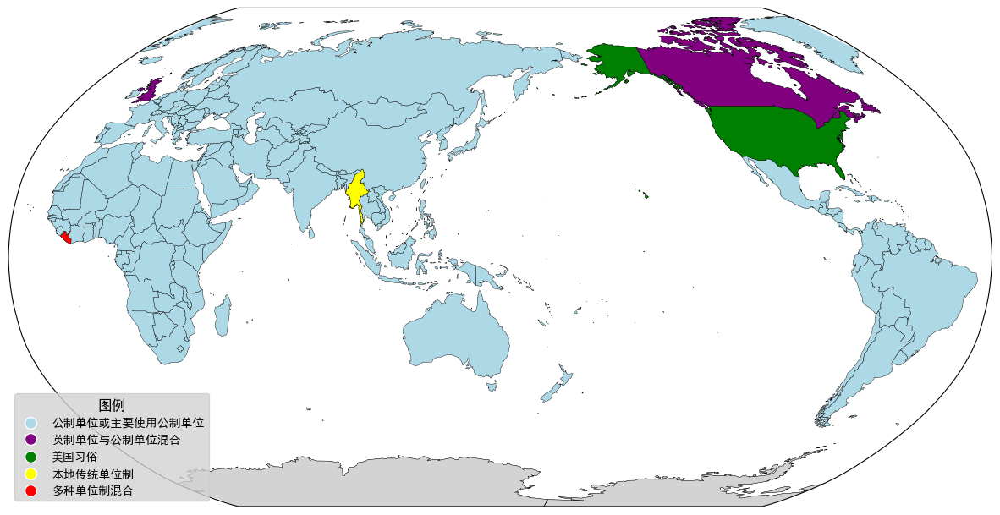

In [21]:
#单位制
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
countries_to_fill1 = ['英国', '加拿大']
countries_to_fill2 = ['美国']
countries_to_fill3 = ['缅甸']
countries_to_fill4 = ['利比里亚']
countries_to_fill5 = ['南极洲']

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='purple', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill2:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='green', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill3:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='yellow', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill4:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill5:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# ax.scatter([12.453337728717626, 7.420229890570174], [41.90328883170313, 43.731219945217916], edgecolor='black', facecolor=['blue', 'red'], marker='o', s=30, zorder=5, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=10, label='公制单位或主要使用公制单位', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='英制单位与公制单位混合', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='美国习俗', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=10, label='本地传统单位制', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='多种单位制混合', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


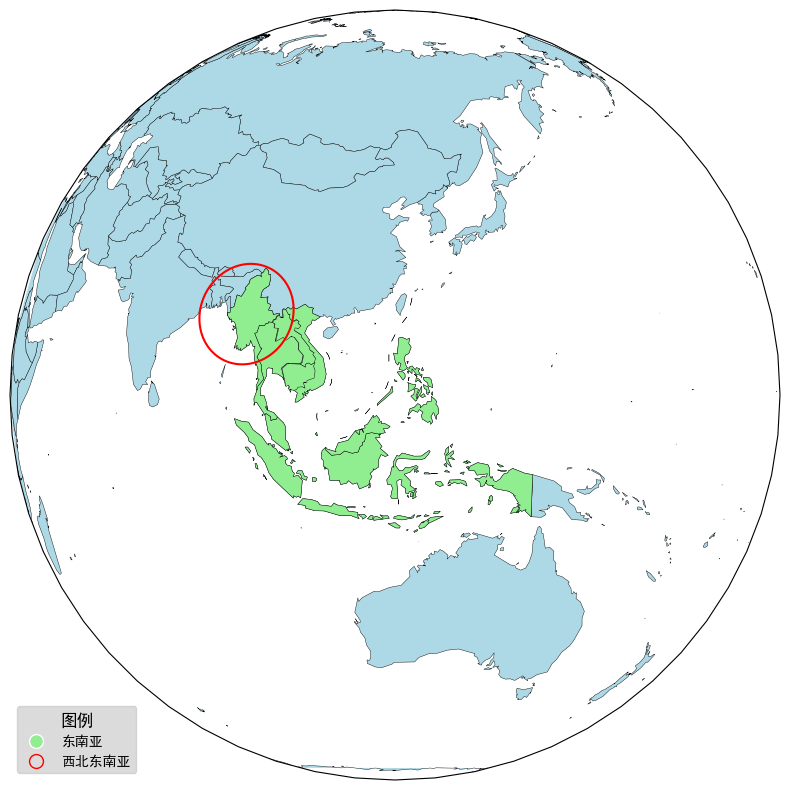

In [9]:
#西北东南亚
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D
import numpy as np
from geopy.distance import geodesic

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
countries_to_fill1 = ['印度尼西亚', '马来西亚', '新加坡', '东帝汶', '菲律宾', '文莱', '泰国', '缅甸', '老挝', '越南', '柬埔寨']

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Orthographic(central_longitude=120, central_latitude=10)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


# 定义点P1和点P2的经纬度
longitude1, latitude1 = 95.30036384230752, 21.377880256552466

lats = np.linspace(-90, 90, 300)
lons = np.linspace(-180, 180, 600)
lon_grid, lat_grid = np.meshgrid(lons, lats)
distance_diff1 = np.zeros(lon_grid.shape)

# 计算每个网格点到目标点的球面距离
for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        distance_diff1[i, j] = geodesic(point, (latitude1, longitude1)).kilometers

# 绘制等高线填充颜色
# contourf1 = ax.contourf(lon_grid, lat_grid, distance_diff1, levels=[-1e10, 705, 1e10], colors=['none', 'none'], transform=ccrs.PlateCarree(), zorder=0)
contour1 = ax.contour(lon_grid, lat_grid, distance_diff1, levels=[850], colors='red', transform=ccrs.PlateCarree(), zorder=3)


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgreen', markersize=10, label='东南亚', linestyle='None'),
    Line2D([0], [0], marker='o', color='red', markerfacecolor='none', markersize=10, label='西北东南亚', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


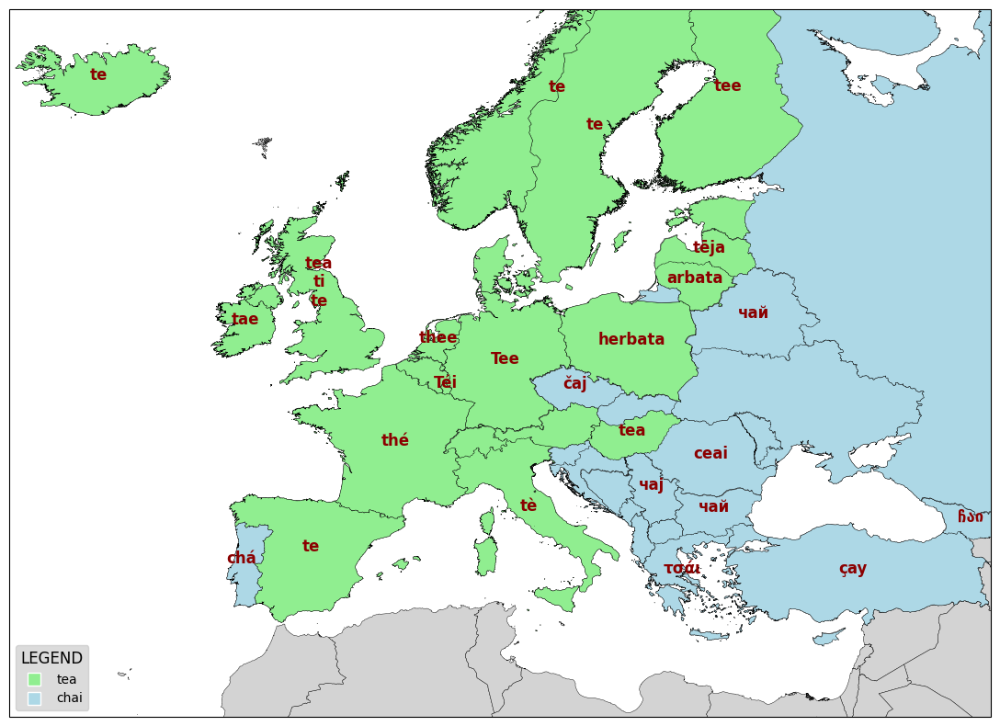

In [6]:
# 欧洲各国语言中的茶
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

# plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
# plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap1/World_countries.shp')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['英国', '法国', '西班牙', '德国', '瑞士', '意大利', '荷兰', '比利时', '丹麦', '冰岛', '瑞典', '挪威', '芬兰', '爱沙尼亚', '拉脱维亚',
                      '立陶宛', '波兰', '爱尔兰', '奥地利', '匈牙利', '卢森堡', '安道尔', '圣马力诺', '列支敦士登']
countries_to_fill2 = ['葡萄牙', '俄罗斯联邦', '白俄罗斯', '乌克兰', '土耳其', '摩尔多瓦', '捷克', '斯洛伐克', '罗马尼亚', '保加利亚', '希腊', '阿尔巴尼亚', '塞尔维亚', '斯洛文尼亚', '克罗地亚', '黑山共和国',
                      '波黑', '塞浦路斯', '前南马其顿', '格鲁吉亚']

country_word = {
    "英国": "tea/ti/te",
    "爱尔兰": "tae",
    "西班牙": "te",
    "法国": "thé",
    "荷兰": "thee",
    "德国": "Tee",
    "意大利": "tè",
    "葡萄牙": "chá",
    "罗马尼亚": "ceai",
    "捷克": "čaj",
    "波兰": "herbata",
    "挪威": "te",
    "瑞典": "te",
    "芬兰": "tee",
    "冰岛": "te",
    "希腊": "τσάι",
    "土耳其": "çay",
    "白俄罗斯": "чай",
    "立陶宛": "arbata",
    "塞尔维亚": "чај",
    "保加利亚": "чай",
    "格鲁吉亚": "ჩაი",
    "拉脱维亚": "tēja",
    "卢森堡": "Téi",
    "匈牙利": "tea"
}

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})


world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    country_geom = country_data.geometry.centroid
    for x, y in zip(country_geom.x, country_geom.y):
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words_multiline:
            ax.text(x, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=12, weight='bold', color='darkred')

for country in countries_to_fill2:
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    country_geom = country_data.geometry.centroid
    for x, y in zip(country_geom.x, country_geom.y):
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words_multiline:
            ax.text(x, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=12, weight='bold', color='darkred')

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='tea', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='chai', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([45, -25, 30, 68], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


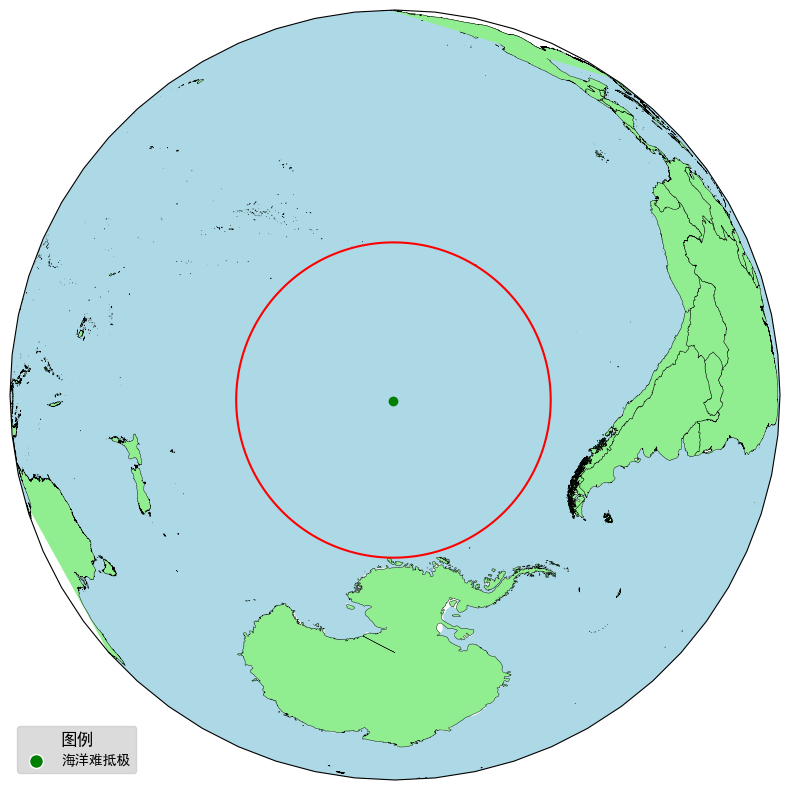

In [15]:
#陆地/海洋难抵极
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D
import numpy as np
from geopy.distance import geodesic

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap1/World_countries.shp')
world = world.to_crs(ccrs.PlateCarree())

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Orthographic(central_longitude=-123, central_latitude=-48)})
ax.add_feature(cfeature.OCEAN, color='lightblue')
world.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

longitude1, latitude1 = -123.385000, -48.868333

lats = np.linspace(-90, 90, 300)
lons = np.linspace(-180, 180, 600)
lon_grid, lat_grid = np.meshgrid(lons, lats)
distance_diff1 = np.zeros(lon_grid.shape)

# 计算每个网格点到目标点的球面距离
for i in range(lon_grid.shape[0]):
    for j in range(lon_grid.shape[1]):
        point = (lat_grid[i, j], lon_grid[i, j])
        distance_diff1[i, j] = geodesic(point, (latitude1, longitude1)).kilometers

contour1 = ax.contour(lon_grid, lat_grid, distance_diff1, levels=[2688], colors='red', transform=ccrs.PlateCarree(), zorder=3)
ax.scatter([longitude1], [latitude1], color='green', marker='o', zorder=15, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='海洋难抵极', linestyle='None'),
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


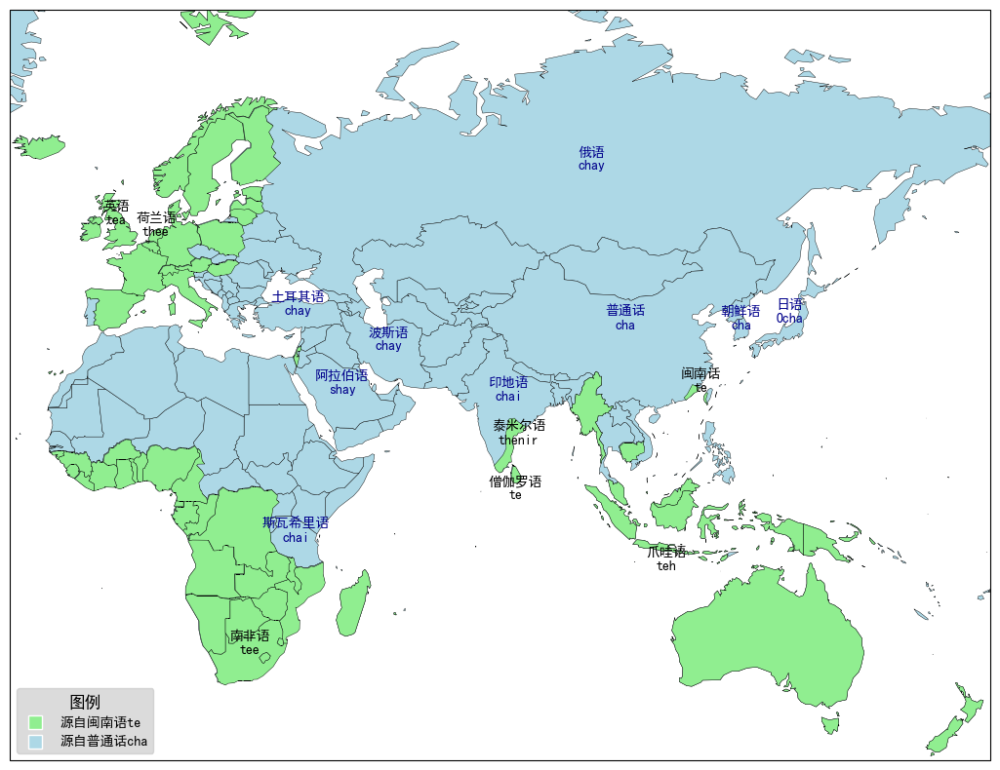

In [29]:
# 世界各国的茶
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
mny = gpd.read_file('./kml2geojson/mny.json')
mny = mny.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['英国', '法国', '西班牙', '德国', '瑞士', '意大利', '荷兰', '比利时', '丹麦', '冰岛', '瑞典', '挪威', '芬兰', '爱沙尼亚', '拉脱维亚',
                      '立陶宛', '波兰', '爱尔兰', '奥地利', '匈牙利', '卢森堡', '安道尔', '圣马力诺', '缅甸', '柬埔寨', '马来西亚', '印度尼西亚', '巴布亚新几内亚',
                      '澳大利亚', '新西兰', '马达加斯加', '莫桑比克', '赞比亚', '津巴布韦', '马拉维', '南非', '斯威士兰', '莱索托', '纳米比亚', '博茨瓦纳', '安哥拉',
                      '刚果（金）', '刚果（布）', '加蓬', '赤道几内亚', '喀麦隆', '尼日利亚', '多哥', '贝宁', '加纳', '科特迪瓦', '布基纳法索', '利比里亚', '塞拉利昂',
                      '几内亚', '几内亚比绍', '斯里兰卡', '以色列']
mny_list = ['mny1', 'mny2', 'mny3']
mandarin_list = ['中国', '坦桑尼亚', '葡萄牙', '伊朗', '印度', '俄罗斯', '土耳其', '沙特阿拉伯', '韩国', '日本']

# country_word = {
#     "mny1": "Min Nan/te",
#     "mny3": "Tamil/thenir",
#     "斯里兰卡": "Sinhala/te",
#     "荷兰": "Dutch/thee",
#     "印度尼西亚": "Javanese/teh",
#     "南非": "Afrikaans/tee",
#     "英国": "English/tea",
#     "土耳其": "Turkish/chay",
#     "俄罗斯": "Russian/chay",
#     "印度": "Hindi/chai",
#     "伊朗": "Persian/chay",
#     "沙特阿拉伯": "Arabic/shay",
#     "坦桑尼亚": "Swalili/chai",
#     "韩国": "Korean/cha",
#     "日本": "Japanese/Ocha",
#     "中国": "Mandarin/cha"
# }

country_word = {
    "mny1": "闽南话/te",
    "mny3": "泰米尔语/thenir",
    "斯里兰卡": "僧伽罗语/te",
    "荷兰": "荷兰语/thee",
    "印度尼西亚": "爪哇语/teh",
    "南非": "南非语/tee",
    "英国": "英语/tea",
    "土耳其": "土耳其语/chay",
    "俄罗斯": "俄语/chay",
    "印度": "印地语/chai",
    "伊朗": "波斯语/chay",
    "沙特阿拉伯": "阿拉伯语/shay",
    "坦桑尼亚": "斯瓦希里语/chai",
    "韩国": "朝鲜语/cha",
    "日本": "日语/Ocha",
    "中国": "普通话/cha"
}

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
mny.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightgreen', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    country_geom = country_data.geometry.centroid
    for x, y in zip(country_geom.x, country_geom.y):
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words_multiline:
            if country == '印度尼西亚':
                ax.text(x-5, y-10, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=10, weight='bold', color='black')
            elif country == '斯里兰卡':
                ax.text(x, y-5, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=10, weight='bold', color='black')
            else:
                ax.text(x, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=10, weight='bold', color='black')

#闽南语+泰米尔语部分：
for polygon in mny_list:
    polygon_data = mny[mny['name'] == polygon]
    polygon_geom = polygon_data.geometry.centroid
    for x, y in zip(polygon_geom.x, polygon_geom.y):
        words = country_word.get(polygon, "")
        words_multiline = '\n'.join(words.split('/'))
        if words_multiline:
            ax.text(x+2, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=10, weight='bold', color='black')

#cha：
for country in mandarin_list:
    country_data = world[world['name'] == country]
    country_geom = country_data.geometry.centroid
    for x, y in zip(country_geom.x, country_geom.y):
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words_multiline:
            ax.text(x, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=10, weight='bold', color='darkblue')


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='源自闽南语te', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='源自普通话cha', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='图例', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent([180, -25, -48, 80], crs=ccrs.PlateCarree())
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


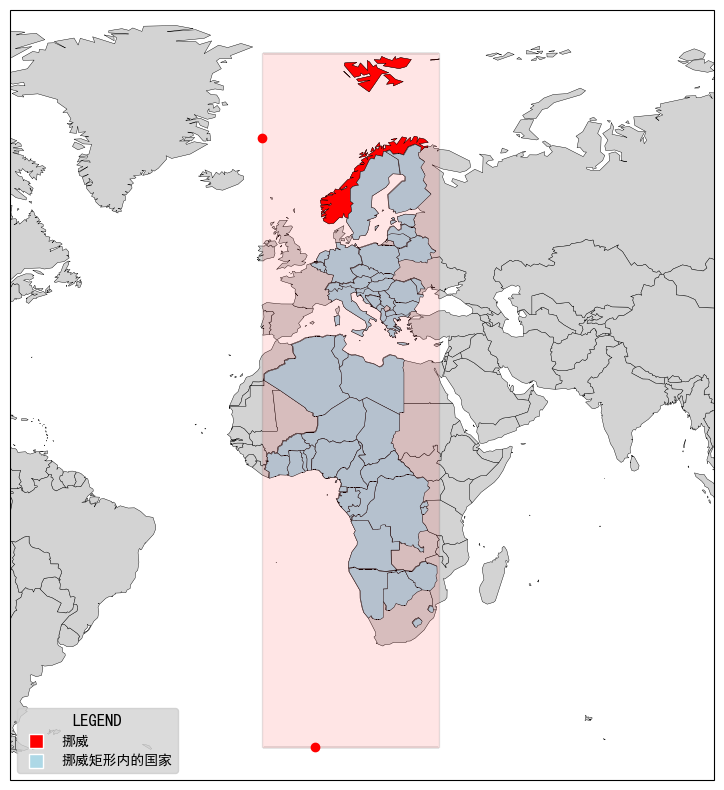

In [22]:
# 挪威的布韦岛
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from shapely.geometry import Polygon

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap4/world.json')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['挪威']
countries_to_fill2 = ['瑞典', '芬兰', '爱沙尼亚', '拉脱维亚', '立陶宛', '白俄罗斯', '比利时', '荷兰', '卢森堡', '德国', '波兰', '捷克', '斯洛伐克', '瑞士', '意大利', '列支敦士登',
                      '奥地利', '匈牙利', '罗马尼亚', '摩尔多瓦', '斯洛文尼亚', '克罗地亚', '波黑', '黑山', '塞尔维亚', '北马其顿', '阿尔巴尼亚', '希腊', '保加利亚', '阿尔及利亚',
                      '突尼斯', '利比亚', '乍得', '尼日尔', '布基纳法索', '科特迪瓦', '加纳', '多哥', '贝宁', '尼日利亚', '喀麦隆', '中非', '尼日利亚', '喀麦隆', '中非',
                      '刚果（金）', '刚果（布）', '喀麦隆', '加蓬', '赤道几内亚', '中非', '安哥拉', '纳米比亚', '博茨瓦纳', '津巴布韦', '斯威士兰', '莱索托', '卢旺达', '布隆迪']
# 矩形区域
coords = [(-9.077461, 80.828928), (33.516317, 80.828928), (33.516317, -54.450000), (-9.077461, -54.450000)]
# 特殊点位
# 布韦岛
lon1, lat1 = 3.516667, -54.450000
# 扬马延岛
lon2, lat2 = -9.077461, 70.863625

polygon = Polygon(coords)
gdf = gpd.GeoDataFrame(index=[0], crs=ccrs.PlateCarree(), geometry=[polygon])


fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})
world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill2:
    country_data = world[world['name'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

gdf.plot(ax=ax, color='red', alpha=0.1, edgecolor='black', transform=ccrs.PlateCarree())
ax.scatter([lon1, lon2], [lat1, lat2], color='red', marker='o', zorder=15, transform=ccrs.PlateCarree())

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label='挪威', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='挪威矩形内的国家', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)

ax.set_extent([-70, 100, -60, 85], crs=ccrs.PlateCarree())


plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


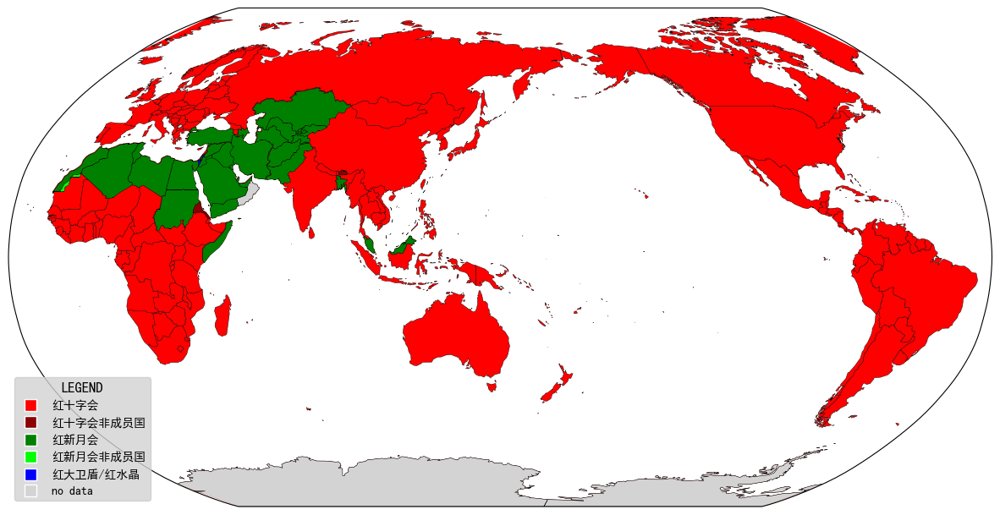

In [43]:
# 亚洲诸国
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from shapely.geometry import Polygon

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='red', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

countries_to_fill0 = ['南极洲', '科索沃', '阿曼']
loopFillColor(countries_to_fill0, 'lightgrey')
countries_to_fill1 = ['以色列']
loopFillColor(countries_to_fill1, 'blue')
countries_to_fill2 = ['摩洛哥', '阿尔及利亚', '突尼斯', '利比亚', '埃及', '苏丹', '索马里', '土耳其', '叙利亚', '约旦', '伊拉克', '沙特阿拉伯', '也门', '阿联酋', '卡塔尔',
                      '伊朗', '阿富汗', '巴基斯坦', '哈萨克斯坦', '乌兹别克斯坦', '土库曼斯坦', '吉尔吉斯斯坦', '塔吉克斯坦', '孟加拉国', '马拉西亚', '巴勒斯坦', '阿塞拜疆',
                      '科威特', '马来西亚', '文莱']
loopFillColor(countries_to_fill2, 'green')
countries_to_fill3 = ['西撒哈拉']
loopFillColor(countries_to_fill3, 'lime')
countries_to_fill4 = ['厄立特里亚', '不丹', '马绍尔群岛']
loopFillColor(countries_to_fill4, 'darkred')

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label='红十字会', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='darkred', markersize=10, label='红十字会非成员国', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='红新月会', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lime', markersize=10, label='红新月会非成员国', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='blue', markersize=10, label='红大卫盾/红水晶', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgrey', markersize=10, label='no data', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


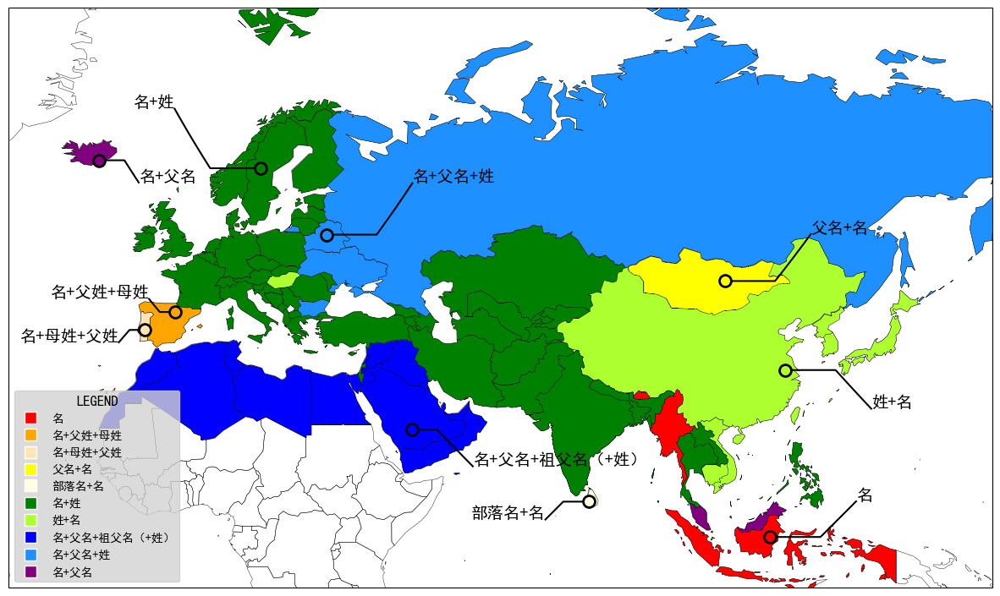

In [1]:
# 名字顺序
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from shapely.geometry import Polygon
import numpy as np

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False


def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


def lineMark(horizontal_length, angle, line_length, lon, lat, direction1, direction2, content, color):
    if direction1 == 1:
        end_lon = lon + horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor=color, marker='o', s=100, linewidths=2, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', transform=ccrs.PlateCarree(), zorder=4)
        ax.text(final_lon, final_lat, content, verticalalignment='bottom', horizontalalignment='left', transform=ccrs.PlateCarree(), fontsize=14)
    elif direction1 == 0:
        end_lon = lon - horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor=color, marker='o', s=100, linewidths=2, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', transform=ccrs.PlateCarree(), zorder=4)
        ax.text(final_lon, final_lat, content, verticalalignment='bottom', horizontalalignment='right', transform=ccrs.PlateCarree(), fontsize=14)
    else:
        print('direction1 type error')


world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
world.plot(ax=ax, color='none', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

# family name + given name
countries_to_fill0 = ['中国', '越南', '朝鲜', '韩国', '日本', '柬埔寨', '匈牙利']
loopFillColor(countries_to_fill0, 'greenyellow')
lineMark(10, 45, 10, 119, 32, 1, 0, '姓+名', 'greenyellow')

#given name + family name
countries_to_fill1 = ['菲律宾', '老挝', '泰国', '印度', '孟加拉国', '尼泊尔', '印度', '巴基斯坦', '阿富汗', '伊朗', '哈萨克斯坦', '吉尔吉斯斯坦', '塔吉克斯坦', '乌兹别克斯坦',
                      '土库曼斯坦', '土耳其', '格鲁吉亚', '亚美尼亚', '阿塞拜疆', '以色列', '英国', '爱尔兰', '挪威', '瑞典', '芬兰', '爱沙尼亚', '拉脱维亚', '立陶宛',
                      '波兰', '德国', '丹麦', '比利时', '荷兰', '卢森堡', '法国', '安道尔', '列支敦士登', '瑞士', '奥地利', '意大利', '斯洛文尼亚', '克罗地亚',
                      '波黑', '塞尔维亚', '黑山', '阿尔巴尼亚', '北马其顿', '罗马尼亚', '摩尔多瓦', '塞浦路斯', '捷克', '斯洛伐克', '希腊']
loopFillColor(countries_to_fill1, 'green')
lineMark(10, 45, 10, 15, 63, 0, 1, '名+姓', 'green')

#given name + patronymic + family name
countries_to_fill2 = ['俄罗斯', '白俄罗斯', '乌克兰', '保加利亚']
loopFillColor(countries_to_fill2, 'dodgerblue')
lineMark(10, 45, 10, 28, 54, 1, 1, '名+父名+姓', 'dodgerblue')

# given name + father's name + grand father's name + (family name)
countries_to_fill3 = ['摩洛哥', '西撒哈拉', '阿尔及利亚', '突尼斯', '利比亚', '埃及', '约旦', '巴勒斯坦', '黎巴嫩', '叙利亚', '伊拉克', '沙特阿拉伯', '阿联酋', '卡塔尔',
                      '也门', '阿曼', '科威特']
loopFillColor(countries_to_fill3, 'blue')
lineMark(5, 45, 10, 45, 21, 1, 0, '名+父名+祖父名（+姓）', 'blue')

# given name
countries_to_fill4 = ['不丹', '缅甸', '印度尼西亚']
loopFillColor(countries_to_fill4, 'red')
lineMark(10, 45, 10, 116, 0, 1, 1, '名', 'red')

# given name + clan name
countries_to_fill5 = ['蒙古']
loopFillColor(countries_to_fill5, 'yellow')
lineMark(10, 45, 10, 107, 47, 1, 1, '父名+名', 'yellow')

# clan name + given name
countries_to_fill7 = ['斯里兰卡']
loopFillColor(countries_to_fill7, 'lightyellow')
lineMark(5, 45, 5, 80, 7, 0, 0, '部落名+名', 'lightyellow')

# given name + patronymic
countries_to_fill8 = ['马来西亚', '冰岛']
loopFillColor(countries_to_fill8, 'purple')
lineMark(5, 45, 4, -17, 64, 1, 0, '名+父名', 'purple')

# given name + father's surname + mother's surname
countries_to_fill9 = ['西班牙']
loopFillColor(countries_to_fill9, 'orange')
lineMark(3, 45, 3, -2, 42, 0, 1, '名+父姓+母姓', 'orange')

# given name + mother's surname + father's surname
countries_to_fill10 = ['葡萄牙']
loopFillColor(countries_to_fill10, 'moccasin')
lineMark(3, 45, 3, -8, 39, 0, 0, '名+母姓+父姓', 'moccasin')

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label='名', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='orange', markersize=10, label='名+父姓+母姓', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='moccasin', markersize=10, label='名+母姓+父姓', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='yellow', markersize=10, label='父名+名', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightyellow', markersize=10, label='部落名+名', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='名+姓', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='greenyellow', markersize=10, label='姓+名', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='blue', markersize=10, label='名+父名+祖父名（+姓）', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='dodgerblue', markersize=10, label='名+父名+姓', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='purple', markersize=10, label='名+父名', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize='large')
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent([-35, 160, -10, 80], crs=ccrs.PlateCarree())
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


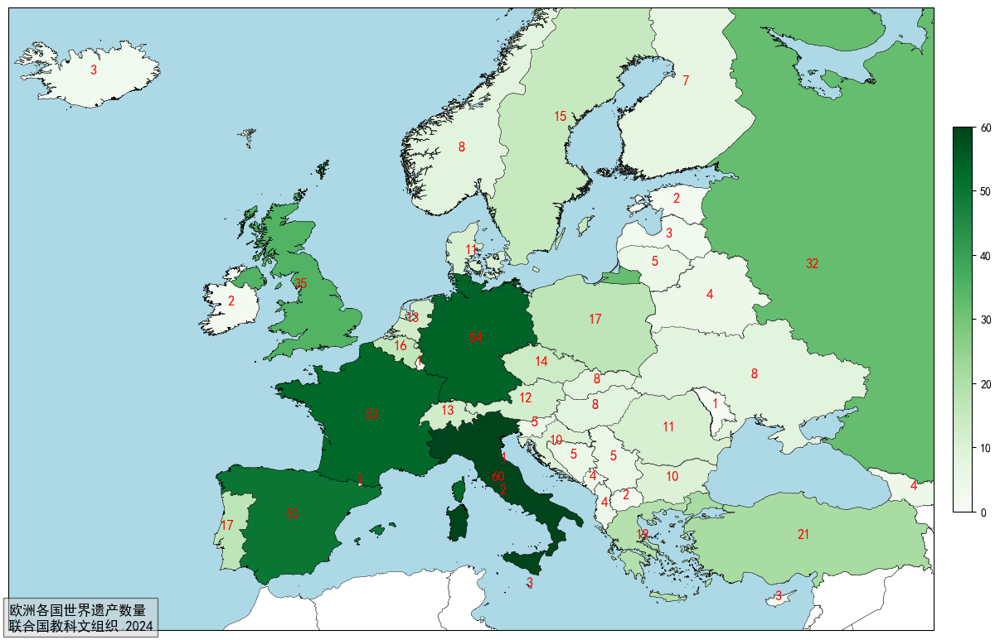

In [1]:
# 渐变色2
# 联合国教科文组织
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

# 读取世界地图数据
world = gpd.read_file('./worldmap1/World_countries.shp')
world = world.to_crs(ccrs.PlateCarree())

# 定义国家及其对应数值
countries_data = [{'英国': 35}, {'爱尔兰': 2}, {'西班牙': 50}, {'葡萄牙': 17}, {'白俄罗斯': 4}, {'比利时': 16}, {'波黑': 5}, {'保加利亚': 10}, {'克罗地亚': 10}, 
                  {'塞浦路斯': 3}, {'捷克': 14}, {'丹麦': 11}, {'爱沙尼亚': 2}, {'芬兰': 7}, {'法国': 53}, {'格鲁吉亚': 4}, {'德国': 54}, {'安道尔': 1}, 
                  {'希腊': 19}, {'匈牙利': 8}, {'冰岛': 3}, {'意大利': 60}, {'拉脱维亚': 3}, {'立陶宛': 5}, {'卢森堡': 1}, {'马耳他': 3}, {'黑山共和国': 4},
                  {'荷兰': 13}, {'前南马其顿': 2}, {'挪威': 8}, {'波兰': 17}, {'摩尔多瓦': 1}, {'罗马尼亚': 11}, {'圣马力诺': 1}, {'梵蒂冈': 2}, {'俄罗斯联邦': 32},
                  {'塞尔维亚': 5}, {'斯洛伐克': 8}, {'斯洛文尼亚': 5}, {'瑞典': 15}, {'瑞士': 13}, {'土耳其': 21}, {'乌克兰': 8}, {'奥地利': 12}, {'阿尔巴尼亚': 4}]

country_dict = {list(item.keys())[0]: list(item.values())[0] for item in countries_data}

# 提取国家名和数值
countries_to_fill = [list(item.keys())[0] for item in countries_data]
values = [list(item.values())[0] for item in countries_data]

# 创建一个渐变色
colors = plt.cm.Greens(np.linspace(0, 1, 100))
cmap = mcolors.LinearSegmentedColormap.from_list('custom_red', colors)

# 自定义归一化范围，使颜色更明显
norm = mcolors.Normalize(vmin=0, vmax=max(values))  # 将vmin设为0

# 绘制地图
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
ax.set_facecolor('lightblue')
world.plot(ax=ax, color='white', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


# 遍历每个国家并填充颜色
for country, value in zip(countries_to_fill, values):
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        color = cmap(norm(value))
        country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    if country == '俄罗斯联邦':
        words = country_dict.get(country, "")
        if words:
            ax.text(35.83161825430054, 55.225920676326865, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=12, weight='bold', color='red')
    elif country == '挪威':
        words = country_dict.get(country, "")
        if words:
            ax.text(9.276330052360837, 61.2715538303058, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=12, weight='bold', color='red')
    else:
        country_geom = country_data.geometry.centroid
        for x, y in zip(country_geom.x, country_geom.y):
            words = country_dict.get(country, "")
            if words:
                ax.text(x, y, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=12, weight='bold', color='red')

# 移除刻度
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 添加颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.02)
# cbar.set_label('单位: kg')

plt.text(0, 0, '欧洲各国世界遗产数量\n联合国教科文组织 2024', transform=ax.transAxes, fontsize='large', bbox=dict(facecolor='lightgray', alpha=0.5))
ax.set_extent([45, -25, 33, 68], crs=ccrs.PlateCarree())

# 保存和显示图片
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


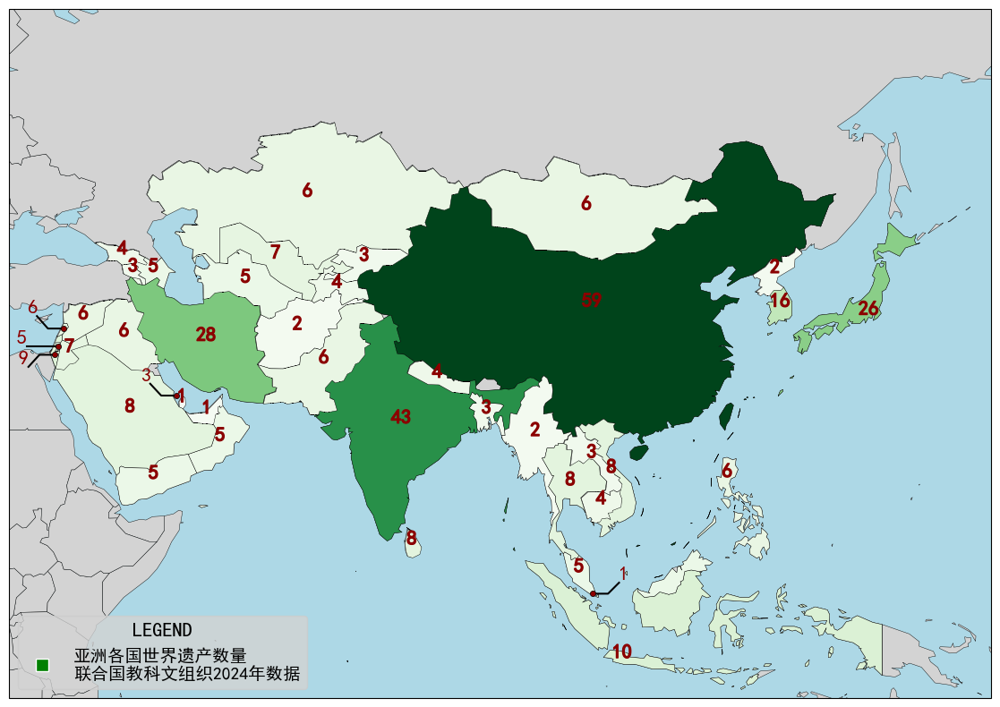

In [3]:
# 渐变色
# 联合国教科文组织
# 世界遗产
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
from matplotlib.lines import Line2D
import matplotlib.patheffects as PathEffects

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False


# 国家填色/标记数字
def labelMark(world, countries_data, exceptList, specialList):
    # 国家及数值数组转换为国家及数值对象
    country_dict = {list(item.keys())[0]: list(item.values())[0] for item in countries_data}
    # 准备渐变色数组
    countries_to_fill = [list(item.keys())[0] for item in countries_data]
    values = [list(item.values())[0] for item in countries_data]
    colors = plt.cm.Greens(np.linspace(0, 1, 100))
    cmap = mcolors.LinearSegmentedColormap.from_list('custom_red', colors)
    norm = mcolors.Normalize(vmin=0, vmax=max(values))
    # 循环上色并打标签
    for country, value in zip(countries_to_fill, values):
        # 各国填充颜色
        country_data = world[world['name'] == country]
        if not country_data.empty:
            color = cmap(norm(value))
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
        # 例外国家的标签坐标需要从例外数组里获取    
        if any(element[0] == country for element in exceptList):
            targetInfo = country_dict.get(country, "")
            x = next((element[1] for element in exceptList if element[0] == country), None)
            y = next((element[2] for element in exceptList if element[0] == country), None)
            if targetInfo:
                txt = ax.text(x, y, f"{targetInfo}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='darkred')
                txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='darkred')])
        elif any(element[0] == country for element in specialList):
            words = country_dict.get(country, "")
            lon = [item for item in specialList if item[0] == country][0][1]
            lat = [item for item in specialList if item[0] == country][0][2]
            direction1 = [item for item in specialList if item[0] == country][0][3]
            direction2 = [item for item in specialList if item[0] == country][0][4]
            angle = [item for item in specialList if item[0] == country][0][5]
            lineMark(2, angle, 2, lon, lat, direction1, direction2, words, 'darkred')
        # 其他国家的标签均打在该国几何中心上
        else:
            country_geom = country_data.geometry.centroid
            for x, y in zip(country_geom.x, country_geom.y):
                words = country_dict.get(country, "")
                if words:
                    txt = ax.text(x, y, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='darkred')
                    txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='darkred')])


# 引申线注释
def lineMark(horizontal_length, angle, line_length, lon, lat, direction1, direction2, content, color):
    if direction1 == 1:
        end_lon = lon + horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor=color, marker='o', s=20, linewidths=0.5, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', transform=ccrs.PlateCarree(), zorder=4)
        ax.text(final_lon, final_lat, content, verticalalignment='bottom', horizontalalignment='left', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='darkred')
    elif direction1 == 0:
        end_lon = lon - horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor=color, marker='o', s=20, linewidths=0.5, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', transform=ccrs.PlateCarree(), zorder=4)
        ax.text(final_lon, final_lat, content, verticalalignment='bottom', horizontalalignment='right', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='darkred')
    else:
        print('direction1 type error')


# 定义国家及其对应数值
# 注：俄罗斯-俄罗斯联邦/黑山-黑山共和国/北马其顿-前南马其顿
countries_data_america = [{'安提瓜和巴布达': 1}, {'阿根廷': 12}, {'澳大利亚': 20},{'巴巴多斯': 1}, {'伯利兹': 1}, {'玻利维亚': 7}, {'巴西': 24},{'加拿大': 22}, {'智利': 7}, 
                          {'哥伦比亚': 9}, {'哥斯达黎加': 4}, {'古巴': 9},{'多米尼加': 1}, {'多米尼克': 1}, {'厄瓜多尔': 5}, {'萨尔瓦多': 1}, {'斐济': 1}, {'危地马拉': 4}, 
                          {'海地': 1}, {'洪都拉斯': 2}, {'牙买加': 1}, {'基里巴斯': 1}, {'马绍尔群岛': 1}, {'墨西哥': 35}, {'密克罗尼西亚': 1}, {'新西兰': 3}, {'尼加拉瓜': 2}, 
                          {'帕劳': 1}, {'巴拿马': 5}, {'巴布亚新几内亚': 1}, {'巴拉圭': 1}, {'秘鲁': 13}, {'圣基茨和尼维斯': 1}, {'圣卢西亚': 1}, {'所罗门群岛': 1}, {'苏里南': 3}, 
                          {'美国': 26}, {'乌拉圭': 3}, {'瓦努阿图': 1}, {'委内瑞拉': 3}]

countries_data_eu = [{'英国': 35}, {'爱尔兰': 2}, {'西班牙': 50}, {'葡萄牙': 17}, {'白俄罗斯': 4}, {'比利时': 16}, {'波黑': 5}, {'保加利亚': 10}, {'克罗地亚': 10}, 
                     {'塞浦路斯': 3}, {'捷克': 14}, {'丹麦': 11}, {'爱沙尼亚': 2}, {'芬兰': 7}, {'法国': 53}, {'德国': 54}, {'安道尔': 1}, {'希腊': 19}, {'匈牙利': 8}, 
                     {'冰岛': 3}, {'意大利': 60}, {'拉脱维亚': 3}, {'立陶宛': 5}, {'卢森堡': 1}, {'马耳他': 3}, {'黑山': 4},{'荷兰': 13}, {'北马其顿': 2}, {'挪威': 8}, 
                     {'波兰': 17}, {'摩尔多瓦': 1}, {'罗马尼亚': 11}, {'圣马力诺': 1}, {'梵蒂冈': 2}, {'俄罗斯': 32},{'塞尔维亚': 5}, {'斯洛伐克': 8}, {'斯洛文尼亚': 5}, 
                     {'瑞典': 15}, {'瑞士': 13}, {'土耳其': 21}, {'乌克兰': 8}, {'奥地利': 12}, {'阿尔巴尼亚': 4}]

countries_data_asia = [{'阿富汗': 2}, {'亚美尼亚': 3}, {'阿塞拜疆': 5}, {'巴林': 3},{'孟加拉国': 3},{'柬埔寨': 4}, {'中国': 59},{'朝鲜': 2}, {'印度': 43}, 
                       {'印度尼西亚': 10}, {'伊朗': 28}, {'伊拉克': 6}, {'以色列': 9}, {'日本': 26}, {'约旦': 7},{'哈萨克斯坦': 6}, {'吉尔吉斯斯坦': 3}, 
                       {'老挝': 3}, {'黎巴嫩': 6},{'马来西亚': 5}, {'蒙古': 6},{'缅甸': 2}, {'尼泊尔': 4}, {'阿曼': 5},{'巴基斯坦': 6}, {'菲律宾': 6}, 
                       {'卡塔尔': 1}, {'韩国': 16},{'沙特阿拉伯': 8}, {'新加坡': 1}, {'斯里兰卡': 8}, {'巴勒斯坦': 5}, {'叙利亚': 6}, {'塔吉克斯坦': 4}, 
                       {'泰国': 8},{'土库曼斯坦': 5}, {'阿联酋': 1}, {'乌兹别克斯坦': 7},{'越南': 8}, {'也门': 5}, {'格鲁吉亚': 4}]

countries_data_afica = [{'阿尔及利亚': 7}, {'安哥拉': 1}, {'贝宁': 3}, {'博茨瓦纳': 2}, {'布基纳法索': 4}, {'佛得角': 1},{'喀麦隆': 2}, {'中非': 2}, {'乍得': 2}, {'刚果（布）': 2},
                        {'科特迪瓦': 5}, {'刚果（金）': 5}, {'埃及': 7}, {'厄立特里亚': 1}, {'加蓬': 2}, {'冈比亚': 2}, {'加纳': 2}, {'几内亚': 1}, {'肯尼亚': 8}, {'莱索托': 1}, 
                        {'利比亚': 5}, {'马达加斯加': 3}, {'马拉维': 2}, {'马里': 4}, {'毛里塔尼亚': 2}, {'摩洛哥': 9}, {'莫桑比克': 1}, {'纳米比亚': 2}, {'尼日尔': 3}, {'尼日利亚': 2},
                        {'卢旺达': 2}, {'塞内加尔': 7}, {'塞舌尔': 2}, {'南非': 12}, {'苏丹': 3}, {'多哥': 1}, {'乌干达': 3}, {'坦桑尼亚': 7}, {'赞比亚': 1}, {'津巴布韦': 5}]

except_counrty_list = [['俄罗斯', 35.83161825430054, 55.225920676326865],
                       ['挪威', 9.276330052360837, 61.2715538303058],
                       ['法国', 2.2654400552752265, 47.57154543270217],
                       ['英国', -0.6146323804400142, 52.32374267361134],
                       ['印度尼西亚', 107.6254599750236, -6.944982574352483],
                       ['马来西亚', 102.12044953727192, 4.0727203031210015],
                       ['日本', 139.22885893740786, 35.5321153023495],
                       ['菲律宾', 121.10035283786888, 16.12397634657303]]
special_country_list = [['黎巴嫩', 36, 34, 0, 1, 45], 
                        ['以色列', 34.911075160058566, 30.97536557305934, 0, 0, 45], 
                        ['巴勒斯坦', 35.2796795412657, 31.964940980098675, 0, 0, 0], 
                        ['巴林', 50.52822237344114, 26.152869908100215, 0, 1, 45], 
                        ['新加坡', 103.83748003436952, 1.3338653773839413, 1, 1, 45]]

# 读取世界地图数据并绘制地图
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
ax.set_facecolor('lightblue')
world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
# 遍历每个国家并填充颜色
labelMark(world, countries_data_asia, except_counrty_list, special_country_list)
# 图例设置
legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='亚洲各国世界遗产数量\n联合国教科文组织2024年数据', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')
# 截图
ax.tick_params(axis='both', which='both', length=0, labelsize=0)
# 欧洲范围
# ax.set_extent([45, -25, 33, 68], crs=ccrs.PlateCarree())
# 亚洲范围
ax.set_extent([29, 155, -12, 65], crs=ccrs.PlateCarree())
# 保存和显示图片
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


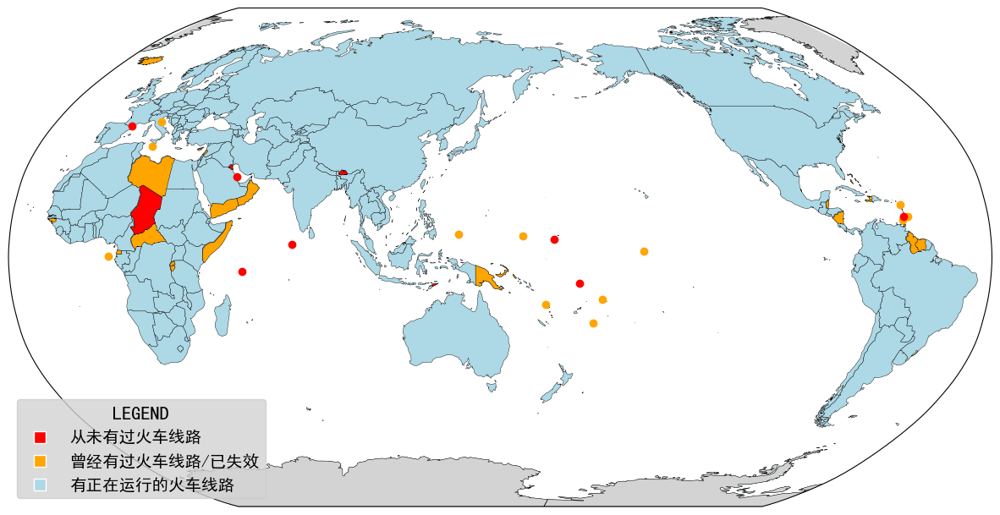

In [11]:
# 没有铁路
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from shapely.geometry import Polygon

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


def drawIslandCountry(island_country, country_list, color):
    latitudes = []
    longitudes = []
    for country in country_list:
        if country in island_country:
            coordinates = island_country[country]
            latitudes.append(coordinates[0])
            longitudes.append(coordinates[1])
    ax.scatter(longitudes, latitudes, color=color, marker='o', zorder=15, transform=ccrs.PlateCarree())


world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

countries_to_fill0 = ['南极洲','格陵兰','北塞浦路斯']
loopFillColor(countries_to_fill0, 'lightgrey')

countries_to_fill1 = ['安提瓜和巴布达', '巴哈马', '巴巴多斯', '伯利兹', '文莱', '布隆迪', '中非', '塞浦路斯', '多米尼克', '赤道几内亚', '格林纳达', '几内亚比绍', 
                      '圭亚那', '海地', '冰岛', '基里巴斯', '黎巴嫩', '利比亚', '马耳他', '密克罗尼西亚', '尼加拉瓜', '阿曼', '帕劳', '巴布亚新几内亚', '卢旺达', 
                      '圣卢西亚', '萨摩亚', '圣马力诺', '圣多美和普林西比', '索马里', '苏里南', '汤加', '特立尼达和多巴哥', '瓦努阿图', '也门']
loopFillColor(countries_to_fill1, 'orange')

countries_to_fill2 = ['安道尔', '巴林', '不丹', '乍得', '东帝汶', '科威特', '马尔代夫', '马绍尔群岛', '圣文森特和格林纳丁斯', '塞舌尔', '图瓦卢']
loopFillColor(countries_to_fill2, 'red')

island_country = {
    '安提瓜和巴布达':[17.089967826893623, -61.7855378496064],
    '巴巴多斯':[13.164041420350955, -59.5521289680981],
    '格林纳达':[12.122113862228266, -61.673334467952486],
    '基里巴斯':[1.8481583802385115, -157.3929723985637],
    '马耳他':[35.913352407104796, 14.409923851158046],
    '密克罗尼西亚':[6.8825268898632785, 158.2282088017763],
    '帕劳':[7.488356129903986, 134.5573641315517],
    '萨摩亚':[-13.591478417872379, -172.43533122131976],
    '圣马力诺':[43.93792627533375, 12.46592907646659],
    '圣多美和普林西比':[0.29971313113035536, 6.607277730117537],
    '汤加':[-21.192247250489682, -175.19411004288972],
    '瓦努阿图':[-15.327100601044503, 166.91994719767138],
    '安道尔':[42.55533690684225, 1.5678292672253036],
    '巴林':[26.08417277603869, 50.54985572504472],
    '马尔代夫':[4.1742945500092015, 73.51053025602174],
    '马绍尔群岛':[5.921044683397229, 169.64306302946653],
    '圣文森特和格林纳丁斯':[13.26438672030793, -61.183523116508844],
    '塞舌尔':[-4.658958934603441, 55.45762756344232],
    '图瓦卢':[-8.520739400898155, 179.19928447986726]
    }

drawIslandCountry(island_country, countries_to_fill1, 'orange')
drawIslandCountry(island_country, countries_to_fill2, 'red')

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label='从未有过火车线路', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='orange', markersize=10, label='曾经有过火车线路/已失效', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='有正在运行的火车线路', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


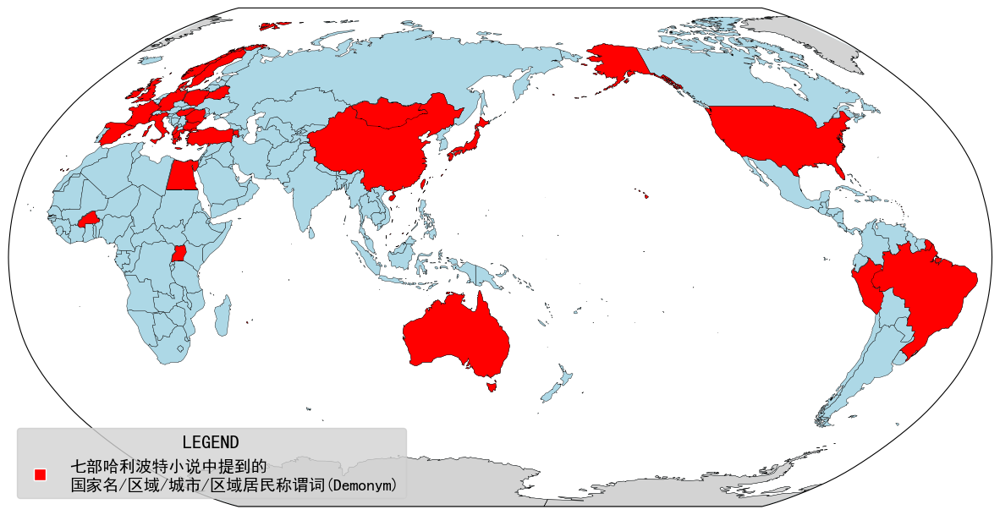

In [1]:
# 哈利波特
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from shapely.geometry import Polygon

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

countries_to_fill0 = ['南极洲', '格陵兰']
loopFillColor(countries_to_fill0, 'lightgrey')

countries_to_fill1 = ['中国', '蒙古', '日本', '澳大利亚', '美国', '巴西', '秘鲁', '英国', '爱尔兰', '法国', '德国', '西班牙', '丹麦', '挪威',
                      '瑞典', '波兰', '白俄罗斯', '意大利', '土耳其', '希腊', '阿尔巴尼亚', '保加利亚', '罗马尼亚', '匈牙利', '埃及', '布基纳法索',
                      '乌干达', '亚美尼亚']
loopFillColor(countries_to_fill1, 'red')


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label='七部哈利波特小说中提到的\n国家名/区域/城市/区域居民称谓词(Demonym)', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
# plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


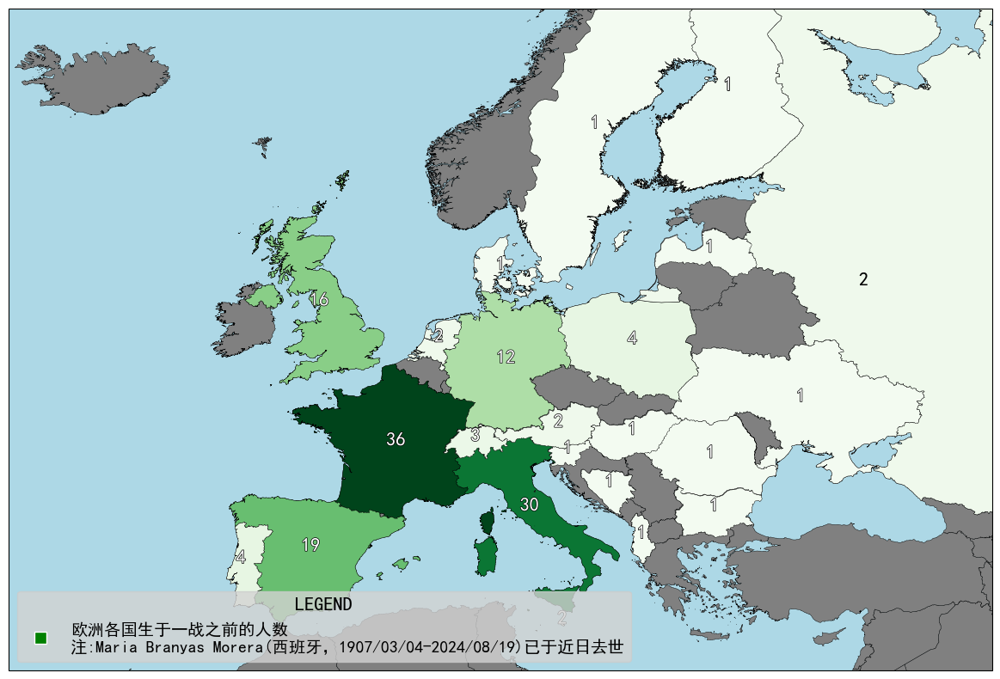

In [9]:
# 百岁老人
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
from matplotlib.lines import Line2D
import matplotlib.patheffects as PathEffects

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False 

# 读取世界地图数据
world = gpd.read_file('./worldmap1/World_countries.shp')
world = world.to_crs(ccrs.PlateCarree())

# 定义国家及其对应数值
countries_data = [{'英国': 16}, {'法国': 36}, {'德国': 12}, {'意大利': 30}, {'西班牙': 19}, {'葡萄牙': 4}, {'波兰': 4}, {'瑞士': 3}, {'奥地利': 2}, 
                  {'匈牙利': 1}, {'斯洛文尼亚': 1}, {'波黑': 1}, {'阿尔巴尼亚': 1}, {'保加利亚': 1}, {'罗马尼亚': 1}, {'乌克兰': 1}, {'俄罗斯联邦': 2}, {'芬兰': 1}, 
                  {'瑞典': 1}, {'芬兰': 1}, {'拉脱维亚': 1}, {'丹麦': 1}, {'荷兰': 2}, {'马耳他': 2}]

country_dict = {list(item.keys())[0]: list(item.values())[0] for item in countries_data}

# 提取国家名和数值
countries_to_fill = [list(item.keys())[0] for item in countries_data]
values = [list(item.values())[0] for item in countries_data]

# 创建一个渐变色
colors = plt.cm.Greens(np.linspace(0, 1, 100))
cmap = mcolors.LinearSegmentedColormap.from_list('custom_red', colors)

# 自定义归一化范围，使颜色更明显
norm = mcolors.Normalize(vmin=0, vmax=max(values))  # 将vmin设为0

# 绘制地图
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
ax.set_facecolor('lightblue')
world.plot(ax=ax, color='grey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


# 遍历每个国家并填充颜色
for country, value in zip(countries_to_fill, values):
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        color = cmap(norm(value))
        country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    if country == '俄罗斯联邦':
        words = country_dict.get(country, "")
        if words:
            ax.text(35.83161825430054, 55.225920676326865, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='black')
    elif country == '挪威':
        words = country_dict.get(country, "")
        if words:
            ax.text(9.276330052360837, 61.2715538303058, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='black')
    else:
        country_geom = country_data.geometry.centroid
        for x, y in zip(country_geom.x, country_geom.y):
            words = country_dict.get(country, "")
            if words:
                txt = ax.text(x, y, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='white')
                txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='black')])

# 移除刻度
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 添加颜色条
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array([])
# cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.02)
# # cbar.set_label('单位: kg')

legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='欧洲各国生于一战之前的人数\n注:Maria Branyas Morera(西班牙，1907/03/04-2024/08/19)已于近日去世', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')

ax.set_extent([45, -25, 33, 68], crs=ccrs.PlateCarree())

# 保存和显示图片
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


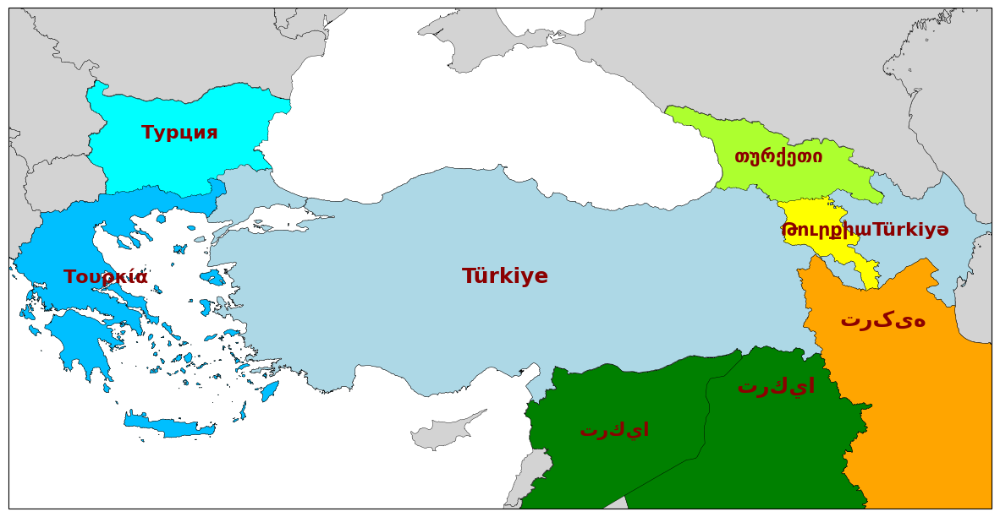

In [11]:
# 土耳其的邻国
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

# plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
# plt.rcParams['axes.unicode_minus'] = False 

world = gpd.read_file('./worldmap1/World_countries.shp')

world = world.to_crs(ccrs.PlateCarree())

countries_to_fill1 = ['土耳其']
countries_to_fill2 = ['希腊', '保加利亚', '格鲁吉亚', '亚美尼亚', '阿塞拜疆', '伊朗', '伊拉克', '叙利亚']

country_word = {
    "希腊": "Τουρκία",
    "保加利亚": "Турция",
    "格鲁吉亚": "თურქეთი",
    "亚美尼亚": "Թուրքիա",
    "阿塞拜疆": "Türkiyə",
    "伊朗": "ترکیه",
    "伊拉克": "تركيا",
    "叙利亚": "تركيا",
    "土耳其": "Türkiye"
}

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller()})


world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())

for country in countries_to_fill1:
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        country_data.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    country_geom = country_data.geometry.centroid
    for x, y in zip(country_geom.x, country_geom.y):
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words_multiline:
            ax.text(x, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=18, weight='bold', color='darkred')

for country in countries_to_fill2:
    country_data = world[world['FCNAME'] == country]
    if not country_data.empty:
        if country == '希腊':
            color = 'deepskyblue'
        elif country == '保加利亚':
            color = 'cyan'
        elif country == '格鲁吉亚':
            color = 'greenyellow'
        elif country == '亚美尼亚':
            color = 'yellow'
        elif country == '阿塞拜疆':
            color = 'lightblue'
        elif country == '伊朗':
            color = 'orange'
        else:
            color = 'green'
        country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    if country == '伊朗':
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words:
            ax.text(46.68767501191723, 37.930834476237855, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=18, weight='bold', color='darkred')
    elif country == '伊拉克':
        words = country_word.get(country, "")
        words_multiline = '\n'.join(words.split('/'))
        if words:
            ax.text(43.419932235429044, 36.16116718033768, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=18, weight='bold', color='darkred')
    else:
        country_geom = country_data.geometry.centroid
        for x, y in zip(country_geom.x, country_geom.y):
            words = country_word.get(country, "")
            words_multiline = '\n'.join(words.split('/'))
            if words_multiline:
                ax.text(x, y, f"{words_multiline}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=16, weight='bold', color='darkred')

# legend_elements = [
#     Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=10, label='tea', linestyle='None'),
#     Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=10, label='chai', linestyle='None')
# ]
# legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize='large')
# legend.get_frame().set_facecolor('lightgray')

ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent([20, 50, 33, 46], crs=ccrs.PlateCarree())
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


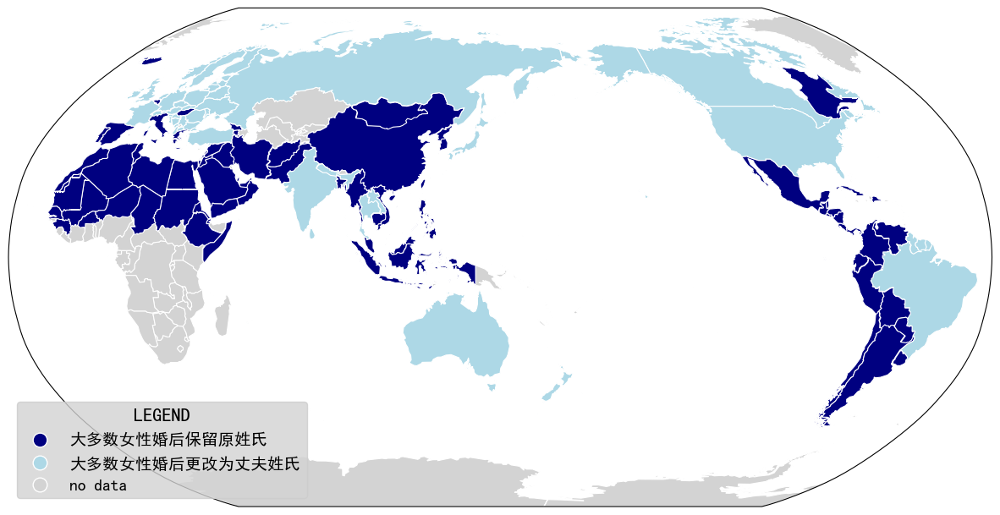

In [15]:
# 婚后姓氏
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False 

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='white', linewidth=0.8, transform=ccrs.PlateCarree())

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
Quebec = gpd.read_file('./kml2geojson/Quebec.json')
Quebec = Quebec.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightgrey', edgecolor='white', linewidth=0.8, transform=ccrs.PlateCarree())

countries_to_fill1 = ['中国', '蒙古', '朝鲜', '韩国', '越南', '柬埔寨', '菲律宾', '马来西亚', '新加坡', '印度尼西亚', '缅甸', '孟加拉国', '巴基斯坦', '阿富汗', '伊朗',
                      '伊拉克', '叙利亚', '黎巴嫩', '约旦', '沙特阿拉伯', '阿联酋', '巴林', '卡塔尔', '阿曼', '也门', '埃及', '苏丹', '埃塞俄比亚','厄立特里亚', '吉布提', 
                      '索马里', '利比亚', '突尼斯', '阿尔及利亚', '摩洛哥', '西撒哈拉', '马里', '毛里塔尼亚', '尼日尔', '乍得', '布基纳法索','塞内加尔', '几内亚', '西班牙', 
                      '葡萄牙', '意大利', '希腊', '匈牙利', '格鲁吉亚', '亚美尼亚', '冰岛', '墨西哥', '古巴', '危地马拉','多米尼加', '伯利兹', '萨尔瓦多', '洪都拉斯', 
                      '尼加拉瓜', '哥斯达黎加', '巴拿马', '委内瑞拉', '哥伦比亚', '厄瓜多尔', '秘鲁', '玻利维亚', '智利', '阿根廷', '乌拉圭', '巴拉圭', '比利时', '以色列', '巴勒斯坦']
loopFillColor(countries_to_fill1, 'navy')

countries_to_fill2 = ['日本', '澳大利亚', '新西兰', '泰国', '老挝', '印度', '斯里兰卡', '尼泊尔', '土耳其', '保加利亚', '北马其顿', '阿尔巴尼亚', '塞尔维亚', '黑山', '波黑',
                      '斯洛文尼亚', '克罗地亚', '罗马尼亚', '摩尔多瓦', '乌克兰', '俄罗斯', '白俄罗斯', '爱沙尼亚', '拉脱维亚', '立陶宛', '波兰', '德国', '捷克','斯洛伐克', '奥地利', 
                      '瑞士', '法国', '丹麦', '荷兰', '英国', '瑞典', '挪威', '芬兰', '加拿大', '美国','巴西', '圭亚那', '苏里南', '爱尔兰']
loopFillColor(countries_to_fill2, 'lightblue')
Quebec.plot(ax=ax, color='navy', edgecolor='white', linewidth=0.8, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='navy', markersize=12, label='大多数女性婚后保留原姓氏', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=12, label='大多数女性婚后更改为丈夫姓氏', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgrey', markersize=12, label='no data', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


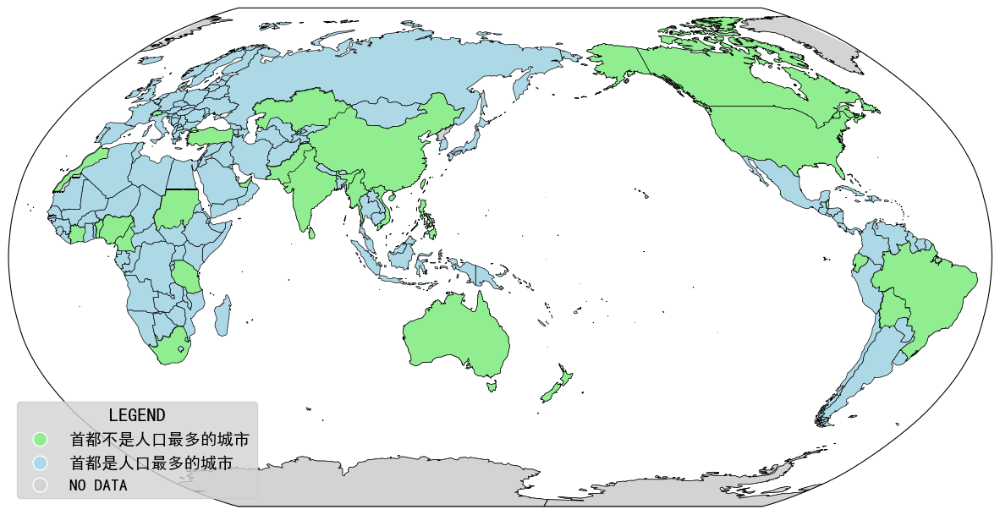

In [3]:
# 首都人口
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False 

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

countries_to_fill1 = ['中国', '越南', '菲律宾', '澳大利亚', '新西兰', '缅甸', '印度', '巴基斯坦', '哈萨克斯坦', '斯里兰卡', '土耳其', '阿联酋', '苏丹', '南非', '坦桑尼亚',
                      '喀麦隆', '尼日利亚', '贝宁', '科特迪瓦', '摩洛哥', '瑞士', '加拿大', '美国', '伯利兹', '巴西', '厄瓜多尔', '玻利维亚']
loopFillColor(countries_to_fill1, 'lightgreen')

countries_to_fill1 = ['格陵兰', '南极洲', '西撒哈拉', '朝鲜']
loopFillColor(countries_to_fill1, 'lightgrey')

# 国歌中有血
# countries_to_fill = ['美国', '阿根廷', '智利', '哥伦比亚', '厄瓜多尔', '挪威', '法国', '意大利', '匈牙利', '荷兰', '比利时', '罗马尼亚', '土耳其', '叙利亚', '阿塞拜疆', 
#                      '土库曼斯坦', '阿联酋', '中国', '尼泊尔', '越南', '柬埔寨', '泰国', '马来西亚', '印度尼西亚', '摩洛哥', '阿尔及利亚', '突尼斯', '尼日尔', '贝宁', 
#                      '布基纳法索', '中非', '喀麦隆', '纳米比亚', '吉布提', '几内亚比绍']

# 国旗在月亮
# countries_to_fill1 = ['美国', '中国']
# countries_to_fill2 = ['马来西亚', '新加坡', '文莱', '巴基斯坦', '尼泊尔', '伊朗', '土库曼斯坦', '乌兹别克斯坦', '阿塞拜疆', '土耳其', '克罗地亚', '摩尔多瓦','毛里塔尼亚', 
#                       '阿尔及利亚', '突尼斯', '利比亚', '老挝']


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgreen', markersize=12, label='首都不是人口最多的城市', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=12, label='首都是人口最多的城市', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgrey', markersize=12, label='NO DATA', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


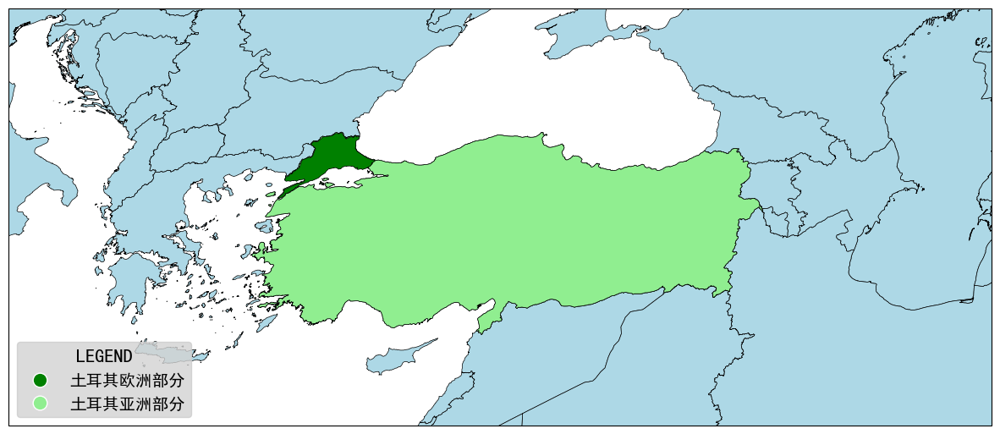

In [5]:
# 土耳其加入的国际组织
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False 

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['FCNAME'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

world = gpd.read_file('./worldmap1/World_countries.shp')
world = world.to_crs(ccrs.PlateCarree())
turkey = gpd.read_file('./kml2geojson/turkey.json')
turkey = turkey.to_crs(ccrs.PlateCarree())

fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

countries_to_fill1 = ['土耳其']
loopFillColor(countries_to_fill1, 'lightgreen')

turkey.plot(ax=ax, color='green', edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=12, label='土耳其欧洲部分', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgreen', markersize=12, label='土耳其亚洲部分', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
ax.set_extent([20, 50, 33, 46], crs=ccrs.PlateCarree())
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


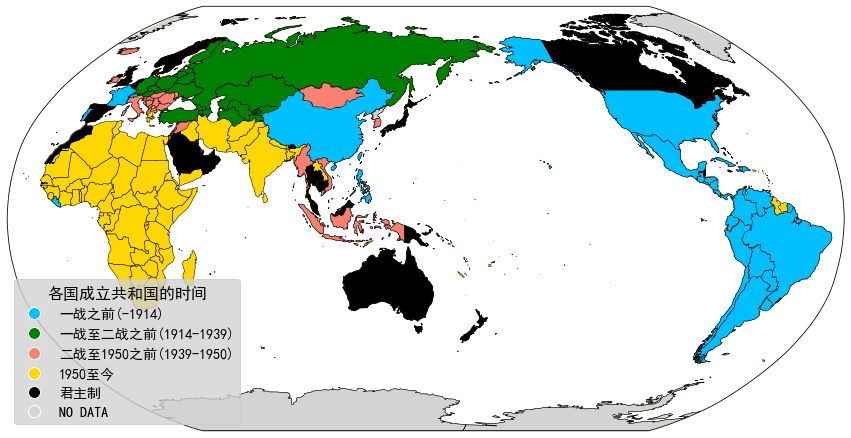

In [1]:
# 共和国
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False 

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='gold', edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

countries_to_fill1 = ['葡萄牙', '法国', '瑞士', '中国', '菲律宾', '美国', '墨西哥', '危地马拉', '伯利兹', '洪都拉斯', '萨尔瓦多', '危地马拉', '哥斯达黎加', '巴拿马', 
                      '哥伦比亚', '委内瑞拉', '厄瓜多尔', '玻利维亚', '智利', '阿根廷', '巴拉圭', '乌拉圭', '巴西', '秘鲁', '古巴', '海地', '多米尼加', '尼加拉瓜', '利比里亚']
loopFillColor(countries_to_fill1, 'deepskyblue')

countries_to_fill2 = ['德国', '奥地利', '捷克', '斯洛伐克', '土耳其', '芬兰', '俄罗斯', '拉脱维亚', '乌克兰', '白俄罗斯', '格鲁吉亚', '亚美尼亚','阿塞拜疆', '土库曼斯坦', 
                      '吉尔吉斯斯坦', '塔吉克斯坦', '乌兹别克斯坦', '哈萨克斯坦', '爱沙尼亚', '立陶宛', '波兰']
loopFillColor(countries_to_fill2, 'green')

countries_to_fill3 = ['朝鲜', '韩国', '缅甸', '越南', '印度尼西亚', '爱尔兰', '冰岛', '意大利', '罗马尼亚', '匈牙利', '摩尔多瓦', '保加利亚','阿尔巴尼亚', '斯洛文尼亚', 
                      '克罗地亚', '塞尔维亚', '波黑', '北马其顿', '蒙古', '以色列', '巴勒斯坦', '黎巴嫩', '叙利亚', '黑山']
loopFillColor(countries_to_fill3, 'salmon')

countries_to_fill4 = ['英国', '荷兰', '丹麦', '挪威', '瑞典', '西班牙', '日本', '巴布亚新几内亚', '澳大利亚', '新西兰', '泰国', '马来西亚', '沙特阿拉伯', '阿联酋',
                      '阿曼', '卡塔尔', '巴林', '摩洛哥', '加拿大', '不丹', '柬埔寨', '比利时', '卢森堡', '安道尔', '牙买加', '伯利兹', '巴哈马', '科威特', '约旦']
loopFillColor(countries_to_fill4, 'black')

countries_to_fill5 = ['格陵兰', '朝鲜', '西撒哈拉', '南极洲', '科索沃']
loopFillColor(countries_to_fill5, 'lightgrey')


legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='deepskyblue', markersize=12, label='一战之前(-1914)', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=12, label='一战至二战之前(1914-1939)', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='salmon', markersize=12, label='二战至1950之前(1939-1950)', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gold', markersize=12, label='1950至今', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=12, label='君主制', linestyle='None'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgrey', markersize=12, label='NO DATA', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='各国成立共和国的时间', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


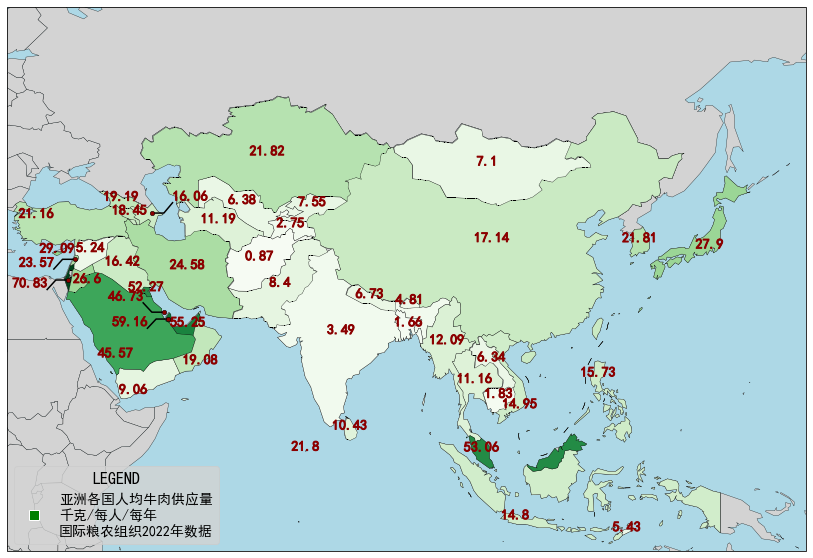

In [1]:
# 渐变色
# 粮农组织
# 肉类供应
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
from matplotlib.lines import Line2D
import matplotlib.patheffects as PathEffects

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False


# 国家填色/标记数字
def labelMark(world, countries_data, exceptList, specialList):
    # 国家及数值数组转换为国家及数值对象
    country_dict = {list(item.keys())[0]: list(item.values())[0] for item in countries_data}
    # 准备渐变色数组
    countries_to_fill = [list(item.keys())[0] for item in countries_data]
    values = [list(item.values())[0] for item in countries_data]
    colors = plt.cm.Greens(np.linspace(0, 1, 100))
    cmap = mcolors.LinearSegmentedColormap.from_list('custom_red', colors)
    norm = mcolors.Normalize(vmin=0, vmax=max(values))
    # 循环上色并打标签
    for country, value in zip(countries_to_fill, values):
        # 各国填充颜色
        country_data = world[world['name'] == country]
        if not country_data.empty:
            color = cmap(norm(value))
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
        # 例外国家的标签坐标需要从例外数组里获取    
        if any(element[0] == country for element in exceptList):
            targetInfo = country_dict.get(country, "")
            x = next((element[1] for element in exceptList if element[0] == country), None)
            y = next((element[2] for element in exceptList if element[0] == country), None)
            if targetInfo:
                txt = ax.text(x, y, f"{targetInfo}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=14, weight='bold', color='darkred')
                txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='darkred')])
        elif any(element[0] == country for element in specialList):
            words = country_dict.get(country, "")
            lon = [item for item in specialList if item[0] == country][0][1]
            lat = [item for item in specialList if item[0] == country][0][2]
            direction1 = [item for item in specialList if item[0] == country][0][3]
            direction2 = [item for item in specialList if item[0] == country][0][4]
            angle = [item for item in specialList if item[0] == country][0][5]
            lineMark(2, angle, 2, lon, lat, direction1, direction2, words, 'darkred')
        # 其他国家的标签均打在该国几何中心上
        else:
            country_geom = country_data.geometry.centroid
            for x, y in zip(country_geom.x, country_geom.y):
                words = country_dict.get(country, "")
                if words:
                    txt = ax.text(x, y, f"{words}", horizontalalignment='center', transform=ccrs.PlateCarree(), fontsize=14, weight='bold', color='darkred')
                    txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='darkred')])


# 引申线注释
def lineMark(horizontal_length, angle, line_length, lon, lat, direction1, direction2, content, color):
    if direction1 == 1:
        end_lon = lon + horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor=color, marker='o', s=20, linewidths=0.5, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', transform=ccrs.PlateCarree(), zorder=4)
        txt = ax.text(final_lon, final_lat, f"{content}", verticalalignment='bottom', horizontalalignment='left', transform=ccrs.PlateCarree(), fontsize=14, weight='bold', color='darkred')
        txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='darkred')])
    elif direction1 == 0:
        end_lon = lon - horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor=color, marker='o', s=20, linewidths=0.5, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', transform=ccrs.PlateCarree(), zorder=4)
        txt = ax.text(final_lon, final_lat, f"{content}", verticalalignment='bottom', horizontalalignment='right', transform=ccrs.PlateCarree(), fontsize=14, weight='bold', color='darkred')
        txt.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='darkred')])
    else:
        print('direction1 type error')


# 定义国家及其对应数值
# 注：俄罗斯-俄罗斯联邦/黑山-黑山共和国/北马其顿-前南马其顿

data = pd.read_csv('./csv/FAOSTAT_data_zh_9-3-2024.csv', encoding='utf-8-sig')
filtered_data = data[data['科目'] == '禽肉']
extracted_data = filtered_data[['地区', '值']]
result = [{row['地区']: row['值']} for _, row in extracted_data.iterrows()]

except_counrty_list = [['俄罗斯', 35.83161825430054, 55.225920676326865],
                       ['挪威', 9.276330052360837, 61.2715538303058],
                       ['法国', 2.2654400552752265, 47.57154543270217],
                       ['英国', -0.6146323804400142, 52.32374267361134],
                       ['印度尼西亚', 107.6254599750236, -6.944982574352483],
                       ['马来西亚', 102.12044953727192, 4.0727203031210015],
                       ['日本', 139.22885893740786, 35.5321153023495],
                       ['菲律宾', 121.10035283786888, 16.12397634657303],
                       ['越南', 108.35870011797307, 11.071627580251779],
                       ['阿曼', 56.39241364364543, 18.083243765315697],
                       ['也门', 45.4638468287182, 13.377255173643828],
                       ['沙特阿拉伯', 42.58330487506677, 19.14881198954842],
                       ['土耳其', 29.711138852985755, 39.83158009809266],
                       ['约旦', 37.956869383129934, 30.501812784627138]]
special_country_list = [['黎巴嫩', 36, 34, 0, 0, 45], 
                        ['以色列', 34.911075160058566, 30.97536557305934, 0, 0, 45], 
                        ['巴勒斯坦', 35.2796795412657, 31.964940980098675, 0, 0, 0], 
                        ['巴林', 50.52822237344114, 26.152869908100215, 0, 1, 45], 
                        ['卡塔尔', 51.22184814787225, 25.107045864302517, 0, 0, 45],
                        ['新加坡', 103.83748003436952, 1.3338653773839413, 1, 1, 45],
                        ['阿塞拜疆', 48.482314233538666, 40.52260161809292, 1, 1, 45]]

# 读取世界地图数据并绘制地图
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=150)})
ax.set_facecolor('lightblue')
world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
# 遍历每个国家并填充颜色
labelMark(world, result, except_counrty_list, special_country_list)
# 图例设置
legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='亚洲各国人均牛肉供应量\n千克/每人/每年\n国际粮农组织2022年数据', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')
# 截图
ax.tick_params(axis='both', which='both', length=0, labelsize=0)
# 欧洲范围
# ax.set_extent([45, -25, 33, 68], crs=ccrs.PlateCarree())
# 亚洲范围
ax.set_extent([25, 155, -12, 65], crs=ccrs.PlateCarree())
# 保存和显示图片
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


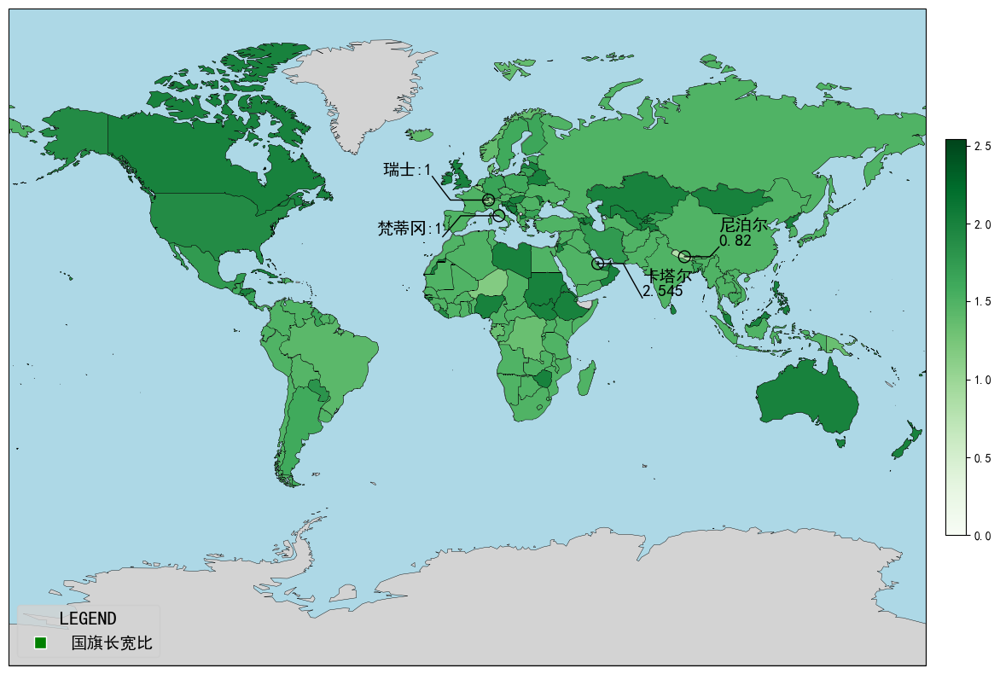

In [9]:
# 渐变色
# 国旗长宽比
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import numpy as np
from matplotlib.lines import Line2D
import matplotlib.patheffects as PathEffects

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False


# 国家填色/标记数字
def labelMark(world, countries_data):
    # 国家及数值数组转换为国家及数值对象
    country_dict = {list(item.keys())[0]: list(item.values())[0] for item in countries_data}
    # 准备渐变色数组
    countries_to_fill = [list(item.keys())[0] for item in countries_data]
    values = [list(item.values())[0] for item in countries_data]
    colors = plt.cm.Greens(np.linspace(0, 1, 100))
    cmap = mcolors.LinearSegmentedColormap.from_list('custom_red', colors)
    norm = mcolors.Normalize(vmin=0, vmax=max(values))
    # 循环上色并打标签
    for country, value in zip(countries_to_fill, values):
        # 各国填充颜色
        country_data = world[world['name'] == country]
        if not country_data.empty:
            color = cmap(norm(value))
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.02)


def lineMark(horizontal_length, angle, line_length, lon, lat, direction1, direction2, content):
    if direction1 == 1:
        end_lon = lon + horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon + line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor='none', marker='o', s=100, linewidths=1, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', linewidth=1, transform=ccrs.PlateCarree(), zorder=4)
        ax.text(final_lon, final_lat, content, verticalalignment='bottom', horizontalalignment='left', transform=ccrs.PlateCarree(), fontsize=14)
    elif direction1 == 0:
        end_lon = lon - horizontal_length
        end_lat = lat
        if direction2 == 1:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat + line_length * np.sin(np.radians(angle))
        elif direction2 == 0:
            final_lon = end_lon - line_length * np.cos(np.radians(angle))
            final_lat = end_lat - line_length * np.sin(np.radians(angle))
        else:
            print('direction2 type error')
        ax.scatter(lon, lat, edgecolor='black', facecolor='none', marker='o', s=100, linewidths=1, zorder=5, transform=ccrs.PlateCarree())
        ax.plot([lon, end_lon, final_lon], [lat, end_lat, final_lat], color='black', linewidth=1, transform=ccrs.PlateCarree(), zorder=4)
        ax.text(final_lon, final_lat, content, verticalalignment='bottom', horizontalalignment='right', transform=ccrs.PlateCarree(), fontsize=14)
    else:
        print('direction1 type error')


data = pd.read_csv('./csv/national_flag.csv', encoding='utf-8-sig')

result = [{row['country']: row['value']} for _, row in data.iterrows()]

# 读取世界地图数据并绘制地图
world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Miller(central_longitude=0)})
ax.set_facecolor('lightblue')
world.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())
# 遍历每个国家并填充颜色
labelMark(world, result)
lineMark(10, 60, 15, 51.23712161273399, 25.215940897652537, 1, 0, '卡塔尔\n2.545')
lineMark(10, 45, 5, 85.26551287841973, 27.717275597916796, 1, 1, '尼泊尔\n0.82')
lineMark(15, 45, 10, 8.379868006923465, 46.91394881306374, 0, 1, '瑞士:1')
lineMark(15, 45, 10, 12.452201102328303, 41.90370811934247, 0, 0, '梵蒂冈:1')
# 图例设置
legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='国旗长宽比', linestyle='None')
]
legend = ax.legend(handles=legend_elements, loc='lower left', title='LEGEND', title_fontsize=16,prop={'size': 14})
legend.get_frame().set_facecolor('lightgray')
ax.tick_params(axis='both', which='both', length=0, labelsize=0)

# 保存和显示图片
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()


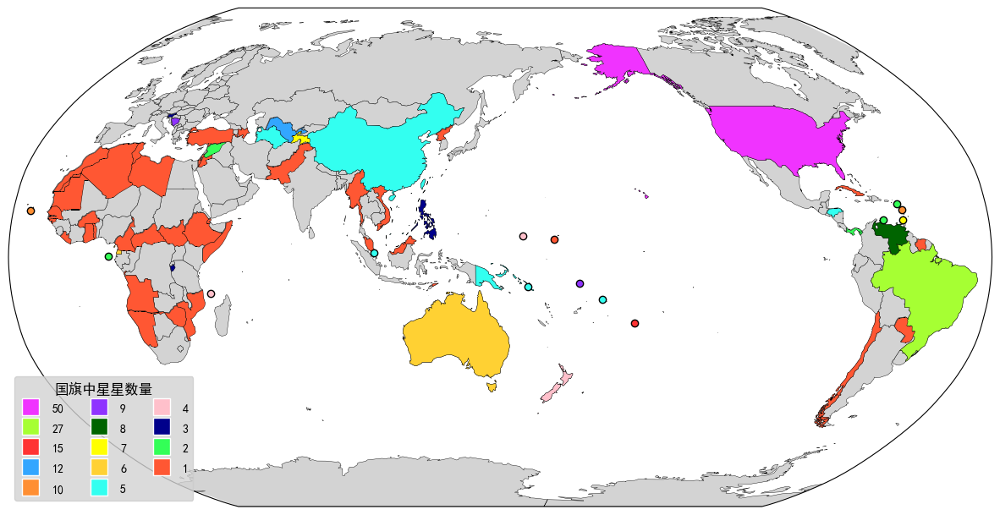

In [12]:
# 国旗的星星
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
from shapely.geometry import Polygon

plt.rcParams['font.sans-serif'] = ['SimHei','Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

def loopFillColor(countryList, color):
    for country in countryList:
        country_data = world[world['name'] == country]
        if not country_data.empty:
            country_data.plot(ax=ax, color=color, edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


def drawIslandCountry(island_country, country_list, color):
    latitudes = []
    longitudes = []
    for country in country_list:
        if country in island_country:
            coordinates = island_country[country]
            latitudes.append(coordinates[0])
            longitudes.append(coordinates[1])
    ax.scatter(longitudes, latitudes, color=color,edgecolor='black', marker='o', zorder=10, transform=ccrs.PlateCarree())


world = gpd.read_file('./worldmap4/world.json')
world = world.to_crs(ccrs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(15, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=150)})
world.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.3, transform=ccrs.PlateCarree())


countries_to_fill1 = ['阿尔及利亚','安哥拉','阿塞拜疆','布基纳法索','喀麦隆','中非','智利','古巴','吉布提','刚果金','埃塞俄比亚','加纳','几内亚比绍','以色列','约旦',
                      '利比里亚','利比亚','马来西亚','马绍尔群岛','毛里塔尼亚','摩洛哥','莫桑比克','缅甸','纳米比亚','瑙鲁','朝鲜','巴基斯坦','巴拉圭','刚果布','塞内加尔',
                      '索马里','南苏丹','苏里南','东帝汶','多哥','突尼斯','土耳其','越南','西撒哈拉','津巴布韦']
loopFillColor(countries_to_fill1, '#FF5733')

countries_to_fill2 = ['库拉索','巴拿马','圣基茨和尼维斯','圣多美和普林西比','叙利亚']
loopFillColor(countries_to_fill2, '#33FF57')

countries_to_fill3 = ['布隆迪','菲律宾','斯洛文尼亚']
loopFillColor(countries_to_fill3, 'darkblue')

countries_to_fill4 = ['科摩罗','密克罗尼西亚','新西兰']
loopFillColor(countries_to_fill4, 'pink')

countries_to_fill5 = ['中国','洪都拉斯','巴布亚新几内亚','萨摩亚','新加坡','所罗门群岛','土库曼斯坦']
loopFillColor(countries_to_fill5, '#33FFF0')

countries_to_fill6 = ['澳大利亚','赤道几内亚']
loopFillColor(countries_to_fill6, '#FFD133')

countries_to_fill7 = ['格林纳达','塔吉克斯坦']
loopFillColor(countries_to_fill7, 'yellow')

countries_to_fill8 = ['委内瑞拉']
loopFillColor(countries_to_fill8, 'darkgreen')

countries_to_fill9 = ['波黑','图瓦卢']
loopFillColor(countries_to_fill9, '#8F33FF')

countries_to_fill10 = ['佛得角','多米尼克']
loopFillColor(countries_to_fill10, '#FF8F33')

countries_to_fill12 = ['乌兹别克斯坦']
loopFillColor(countries_to_fill12, '#33A6FF')

countries_to_fill15 = ['库克群岛']
loopFillColor(countries_to_fill15, '#FF3333')

countries_to_fill27 = ['巴西']
loopFillColor(countries_to_fill27, '#A6FF33')

countries_to_fill50 = ['美国']
loopFillColor(countries_to_fill50, '#F033FF')

island_country = {
    '库克群岛':[-21.235266662743765, -159.77640155811218],
    '佛得角':[15.075660583762867, -23.627715927228998],
    '格林纳达':[12.122113862228266, -61.673334467952486],
    '多米尼克':[15.436902727777584, -61.338979738651105],
    '所罗门群岛':[-9.486442050187662, 160.17259557318891],
    '密克罗尼西亚':[6.8825268898632785, 158.2282088017763],
    '帕劳':[7.488356129903986, 134.5573641315517],
    '萨摩亚':[-13.591478417872379, -172.43533122131976],
    '圣马力诺':[43.93792627533375, 12.46592907646659],
    '圣多美和普林西比':[0.29971313113035536, 6.607277730117537],
    '汤加':[-21.192247250489682, -175.19411004288972],
    '瓦努阿图':[-15.327100601044503, 166.91994719767138],
    '安道尔':[42.55533690684225, 1.5678292672253036],
    '库拉索':[12.128071224145407, -68.9315771483982],
    '马尔代夫':[4.1742945500092015, 73.51053025602174],
    '马绍尔群岛':[5.921044683397229, 169.64306302946653],
    '圣文森特和格林纳丁斯':[13.26438672030793, -61.183523116508844],
    '塞舌尔':[-4.658958934603441, 55.45762756344232],
    '新加坡':[1.3620466932996915, 103.80715635526157],
    '圣基茨和尼维斯':[17.344593346604913, -62.79068450811422],
    '科摩罗':[-11.714088255340494, 43.3312097402893],
    '图瓦卢':[-8.520739400898155, 179.19928447986726]
    }

drawIslandCountry(island_country, countries_to_fill1, '#FF5733')
drawIslandCountry(island_country, countries_to_fill2, '#33FF57')
drawIslandCountry(island_country, countries_to_fill4, 'pink')
drawIslandCountry(island_country, countries_to_fill5, '#33FFF0')
drawIslandCountry(island_country, countries_to_fill7, 'yellow')
drawIslandCountry(island_country, countries_to_fill9, '#8F33FF')
drawIslandCountry(island_country, countries_to_fill10, '#FF8F33')
drawIslandCountry(island_country, countries_to_fill15, '#FF3333')


legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#F033FF', markersize=15, label='50', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#A6FF33', markersize=15, label='27', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#FF3333', markersize=15, label='15', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#33A6FF', markersize=15, label='12', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#FF8F33', markersize=15, label='10', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#8F33FF', markersize=15, label='9', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='darkgreen', markersize=15, label='8', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='yellow', markersize=15, label='7', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#FFD133', markersize=15, label='6', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#33FFF0', markersize=15, label='5', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=15, label='4', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='darkblue', markersize=15, label='3', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#33FF57', markersize=15, label='2', linestyle='None'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='#FF5733', markersize=15, label='1', linestyle='None')
]

legend = ax.legend(handles=legend_elements, loc='lower left', title='国旗中星星数量', title_fontsize='large', ncol=3, handleheight=1.5)
legend.get_frame().set_facecolor('lightgray')


ax.tick_params(axis='both', which='both', length=0, labelsize=0)
plt.savefig('output1.png', dpi=300, bbox_inches='tight')
plt.show()
